In [1]:
# Librairies personnalisées
from my_functions.common_functions import *
from my_functions.uni_bi_variate_functions import *
from my_functions.machine_learning_common_functions import *
from my_functions.dimensionality_reduction_functions import *

from sklearn.manifold import TSNE, Isomap
import umap
from sklearn.cluster import AgglomerativeClustering, KMeans, MiniBatchKMeans,BisectingKMeans, DBSCAN
from kmodes.kmodes import KModes
from kmodes.kprototypes import KPrototypes
import shap

from plotnine import *
import plotnine

%matplotlib inline
low_memory=False # faible mémoire vive (RAM) pour gérer la lecture de gros fichiers

# Chargement & Fusion des Données

## Clients

Le data set contient :
	- 99441 lignes et 5 colonnes.
	- 0 valeurs manquantes, ce qui représente 0.0 % du data set.
Voici un sous-échantillon aléatoire :


,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
59352,3d77e17344794d675894ff95646e5861,50734d03fb153fc7551157cea64536fa,9112,santo andre,SP
56452,dd46295089c77ce6e11f35d38c0ad464,c0082140a6a2214f91d11cc7c77b95d3,4564,sao paulo,SP


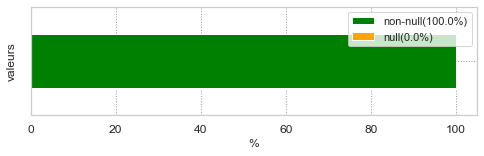

In [2]:
customers = pd.read_csv('olist_customers_dataset.csv', low_memory=low_memory)

verifier_taille(customers)
afficher_echantillon(customers)

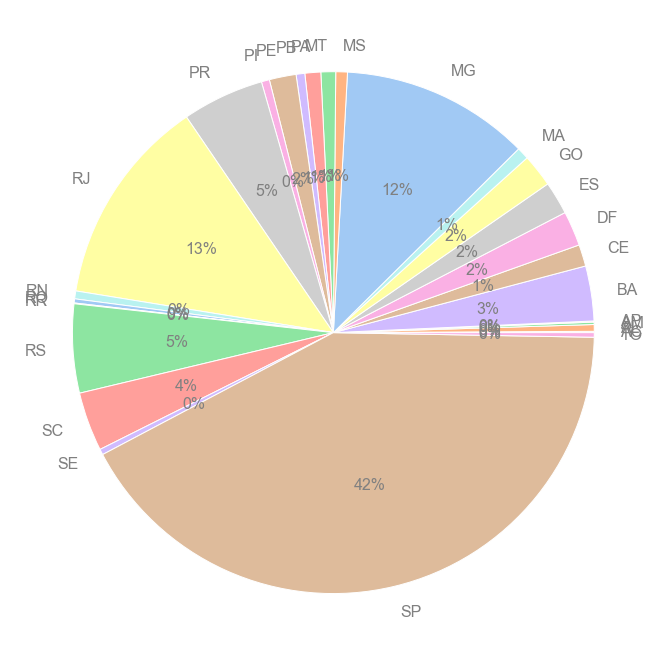

In [3]:
states = customers.groupby('customer_state').count()['customer_unique_id']

colors = sns.color_palette('pastel')
fig, ax = plt.subplots(figsize=(12, 12))
plt.pie(states, labels=states.index.tolist(), colors = colors, autopct = '%0.0f%%', textprops = {'color': 'Gray','fontsize':16})
plt.show()

In [4]:
customers.loc[~customers['customer_state'].isin(states.sort_values(ascending=False).iloc[:5].index), 'customer_state']='other'
customers

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP
...,...,...,...,...,...
99436,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP
99437,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP
99438,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,other
99439,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS


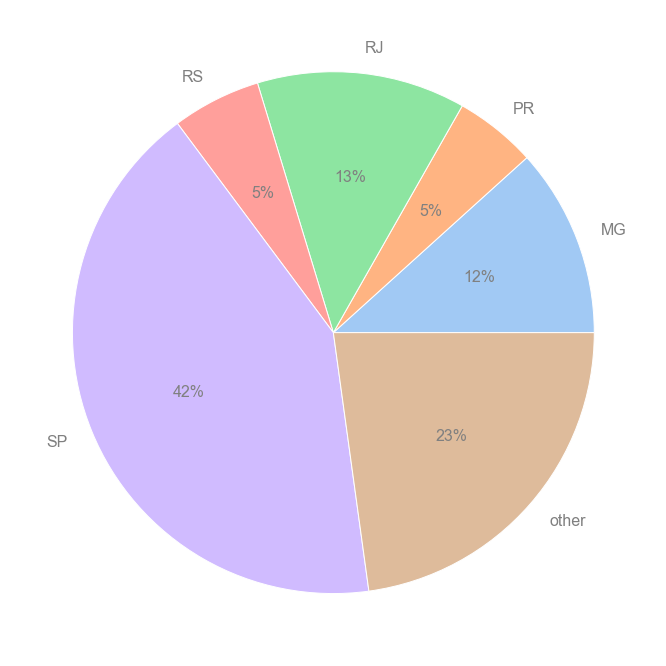

In [5]:
states = customers.groupby('customer_state').count()['customer_unique_id']

colors = sns.color_palette('pastel')
fig, ax = plt.subplots(figsize=(12, 12))
plt.pie(states, labels=states.index.tolist(), colors = colors, autopct = '%0.0f%%', textprops = {'color': 'Gray','fontsize':16})
plt.show()

In [6]:
all_customers = customers.groupby('customer_unique_id').count().sort_values(by='customer_id',ascending=False)
all_customers

,customer_id,customer_zip_code_prefix,customer_city,customer_state
customer_unique_id,,,,
8d50f5eadf50201ccdcedfb9e2ac8455,17,17,17,17
3e43e6105506432c953e165fb2acf44c,9,9,9,9
6469f99c1f9dfae7733b25662e7f1782,7,7,7,7
ca77025e7201e3b30c44b472ff346268,7,7,7,7
1b6c7548a2a1f9037c1fd3ddfed95f33,7,7,7,7
...,...,...,...,...
5657dfebff5868c4dc7e8355fea865c4,1,1,1,1
5657596addb4d7b07b32cd330614bdf8,1,1,1,1
5656eb169546146caeab56c3ffc3d268,1,1,1,1


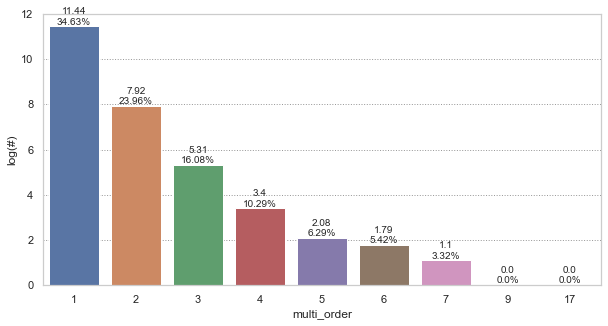

In [7]:
freq = all_customers.groupby('customer_id').count().iloc[:,0]

barplot(x=freq.index.tolist(), y=np.log(freq), ylabel='log(#)', xlabel='multi_order')

In [8]:
frequent_customers = all_customers[all_customers['customer_id']>1]
frequent_customers

,customer_id,customer_zip_code_prefix,customer_city,customer_state
customer_unique_id,,,,
8d50f5eadf50201ccdcedfb9e2ac8455,17,17,17,17
3e43e6105506432c953e165fb2acf44c,9,9,9,9
6469f99c1f9dfae7733b25662e7f1782,7,7,7,7
ca77025e7201e3b30c44b472ff346268,7,7,7,7
1b6c7548a2a1f9037c1fd3ddfed95f33,7,7,7,7
...,...,...,...,...
5cfc9643603c095fd7ed86a50fa17887,2,2,2,2
cfb025f193db116549c9c23e4d58e3e3,2,2,2,2
609b7feab0f0c9726929ec4891447b02,2,2,2,2


In [9]:
print(round(len(frequent_customers)/len(all_customers)*100, 2), '% des cliens ont passées plus d\'une commande')

3.12 % des cliens ont passées plus d'une commande


## Commandes

Le data set contient :
	- 99441 lignes et 8 colonnes.
	- 4908 valeurs manquantes, ce qui représente 0.62 % du data set.
Voici un sous-échantillon aléatoire :


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
7093,58199a8d18062ab7c3fee55f16366d45,b6b70c77dbd33d427f330cbd6296002d,delivered,2017-06-26 09:29:20,2017-06-26 10:34:21,2017-06-27 09:30:06,2017-07-04 16:05:37,2017-07-14 00:00:00
520,40ef667b4259d5f521a0fd1a093d0415,bb8bd97c39739129411746c4ca7c754f,delivered,2018-07-11 19:25:07,2018-07-12 04:06:09,2018-07-12 15:04:00,2018-07-13 17:45:33,2018-07-20 00:00:00


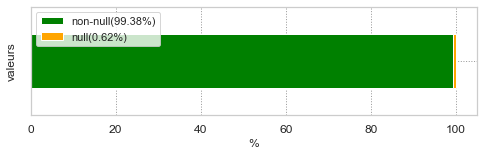

In [10]:
orders = pd.read_csv('olist_orders_dataset.csv', low_memory=low_memory)

verifier_taille(orders)
afficher_echantillon(orders)

In [11]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'], infer_datetime_format=True)

In [12]:
orders.order_status.unique()

array(['delivered', 'invoiced', 'shipped', 'processing', 'unavailable',
       'canceled', 'created', 'approved'], dtype=object)

In [13]:
orders[orders['order_status']!='delivered']

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaN,NaN,2017-05-09 00:00:00
44,ee64d42b8cf066f35eac1cf57de1aa85,caded193e8e47b8362864762a83db3c5,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaN,2018-06-28 00:00:00
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaN,NaN,2018-08-21 00:00:00
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaN,NaN,2017-10-03 00:00:00
154,6942b8da583c2f9957e990d028607019,52006a9383bf149a4fb24226b173106f,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaN,2018-02-07 00:00:00
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaN,NaN,NaN,2018-10-01 00:00:00
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaN,NaN,2018-02-06 00:00:00
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaN,NaN,NaN,2018-09-27 00:00:00
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaN,NaN,2017-09-15 00:00:00


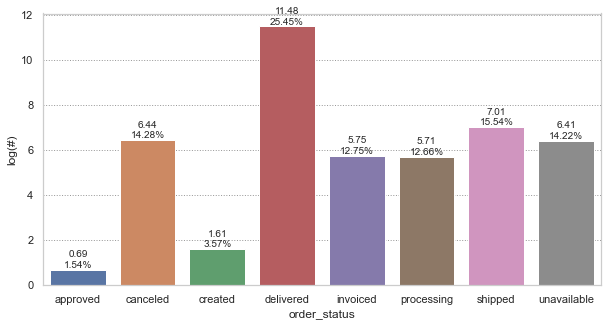

In [14]:
status = orders.groupby('order_status').count()['order_id']
status = np.log(status)

barplot(x=status.index.tolist(), y=status, ylabel='log(#)', xlabel='order_status')

In [15]:
# Garder uniquement les commandes livrées
orders = orders[orders['order_status']=='delivered']

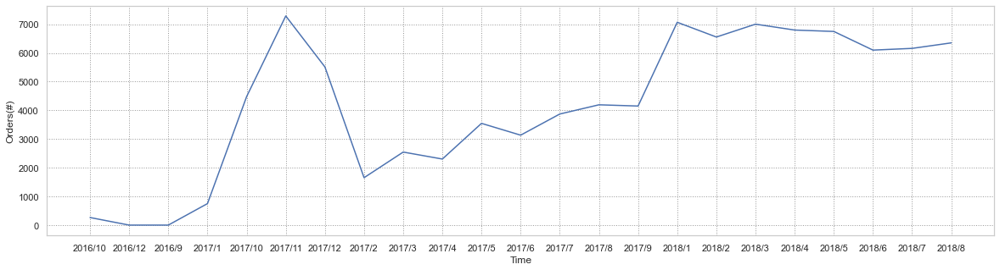

In [16]:
# Fréquence d'achats dans le temps
orders = orders[['customer_id', 'order_id', 'order_purchase_timestamp']]

orders['time'] = orders['order_purchase_timestamp'].apply(lambda x: str(x.year)+'/'+str(x.month))
orders_time = orders.groupby('time').count()['order_id']
orders = orders.drop(columns='time')

lineplot(x=orders_time.index.tolist(), y=orders_time, ylabel='Orders(#)', xlabel='Time', width=20)

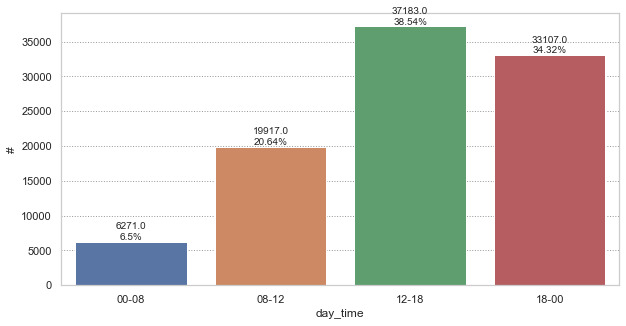

In [17]:
# Fréquence d'achats par moments du jour
orders['daytime'] = orders['order_purchase_timestamp'].dt.hour
orders['daytime'] = orders['daytime'].apply(lambda x : 0 if x>=0 and x <8 else 1 if x<12 else 2 if x<18 else 3)
orders_daytime = orders.groupby('daytime').count()['order_id']

barplot(x=['00-08', '08-12', '12-18', '18-00'], y=orders_daytime, ylabel='#', xlabel='day_time')

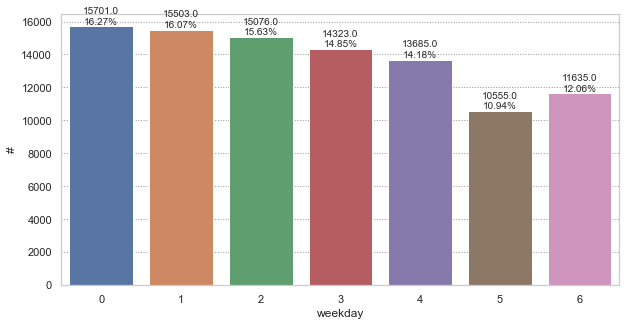

In [18]:
# Fréquence d'achats par jour de semaine
orders['weekday'] = orders['order_purchase_timestamp'].dt.weekday
orders_weekday= orders.groupby('weekday').count()['order_id']

barplot(x=orders_weekday.index.tolist(), y=orders_weekday, ylabel='#', xlabel='weekday')

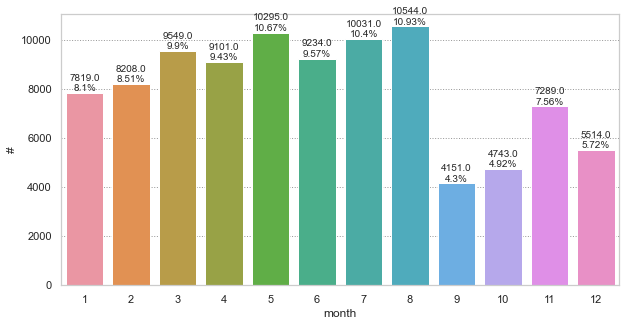

In [19]:
# Fréquence d'achats par mois de l'année
orders['month'] = orders['order_purchase_timestamp'].dt.month
orders_month= orders.groupby('month').count()['order_id']

barplot(x=orders_month.index.tolist(), y=orders_month, ylabel='#', xlabel='month')

p-value is:  4.233030316360296e-160
chi=808.810731, critical value=28.869299
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
    They are not independent.


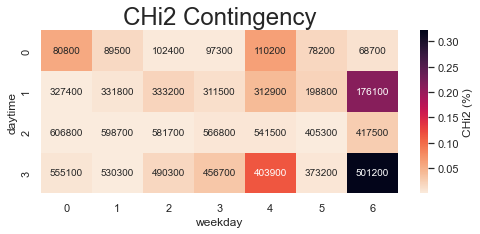

In [20]:
chi2(orders, 'daytime', 'weekday', heigth=3, width=8)

In [21]:
orders

,customer_id,order_id,order_purchase_timestamp,daytime,weekday,month
0,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33,1,0,10
1,b0830fb4747a6c6d20dea0b8c802d7ef,53cdb2fc8bc7dce0b6741e2150273451,2018-07-24 20:41:37,3,1,7
2,41ce2a54c0b03bf3443c3d931a367089,47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:38:49,1,2,8
3,f88197465ea7920adcdbec7375364d82,949d5b44dbf5de918fe9c16f97b45f8a,2017-11-18 19:28:06,3,5,11
4,8ab97904e6daea8866dbdbc4fb7aad2c,ad21c59c0840e6cb83a9ceb5573f8159,2018-02-13 21:18:39,3,1,2
...,...,...,...,...,...,...
99436,39bd1228ee8140590ac3aca26f2dfe00,9c5dedf39a927c1b2549525ed64a053c,2017-03-09 09:54:05,1,3,3
99437,1fca14ff2861355f6e5f14306ff977a7,63943bddc261676b46f01ca7ac2f7bd8,2018-02-06 12:58:58,2,1,2
99438,1aa71eb042121263aafbe80c1b562c9c,83c1379a015df1e13d02aae0204711ab,2017-08-27 14:46:43,2,6,8
99439,b331b74b18dc79bcdf6532d51e1637c1,11c177c8e97725db2631073c19f07b62,2018-01-08 21:28:27,3,0,1


In [22]:
orders.groupby('month').count().loc[2][0]

8208

In [23]:
for col in ['daytime', 'weekday', 'month']:
    orders = OrdinalEncoding(orders, col)
orders

,customer_id,order_id,order_purchase_timestamp,daytime,weekday,month
0,9ef432eb6251297304e76186b10a928d,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33,1.0,6.0,1.0
1,b0830fb4747a6c6d20dea0b8c802d7ef,53cdb2fc8bc7dce0b6741e2150273451,2018-07-24 20:41:37,2.0,5.0,9.0
2,41ce2a54c0b03bf3443c3d931a367089,47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:38:49,1.0,4.0,11.0
3,f88197465ea7920adcdbec7375364d82,949d5b44dbf5de918fe9c16f97b45f8a,2017-11-18 19:28:06,2.0,0.0,3.0
4,8ab97904e6daea8866dbdbc4fb7aad2c,ad21c59c0840e6cb83a9ceb5573f8159,2018-02-13 21:18:39,2.0,5.0,5.0
...,...,...,...,...,...,...
99436,39bd1228ee8140590ac3aca26f2dfe00,9c5dedf39a927c1b2549525ed64a053c,2017-03-09 09:54:05,1.0,3.0,8.0
99437,1fca14ff2861355f6e5f14306ff977a7,63943bddc261676b46f01ca7ac2f7bd8,2018-02-06 12:58:58,3.0,5.0,5.0
99438,1aa71eb042121263aafbe80c1b562c9c,83c1379a015df1e13d02aae0204711ab,2017-08-27 14:46:43,3.0,1.0,11.0
99439,b331b74b18dc79bcdf6532d51e1637c1,11c177c8e97725db2631073c19f07b62,2018-01-08 21:28:27,2.0,6.0,4.0


## df = Customers x Orders

In [24]:
df = pd.merge(customers[['customer_unique_id', 'customer_id', 'customer_state']], orders, how='inner', on=['customer_id']).drop(columns='customer_id')
print('Doublons :', len(doublons(df['order_id'])))
df

Doublons : 0


,customer_unique_id,customer_state,order_id,order_purchase_timestamp,daytime,weekday,month
0,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,3.0,5.0,10.0
1,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2.0,2.0,4.0
2,060e732b5b29e8181a18229c7b0b2b5e,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,3.0,0.0,10.0
3,259dac757896d24d7702b9acbbff3f3c,SP,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,3.0,5.0,8.0
4,345ecd01c38d18a9036ed96c73b8d066,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,1.0,1.0,9.0
...,...,...,...,...,...,...,...
96473,1a29b476fee25c95fbafc67c5ac95cf8,SP,6760e20addcf0121e9d58f2f1ff14298,2018-04-07 15:48:17,3.0,0.0,6.0
96474,d52a67c98be1cf6a5c84435bd38d095d,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,2018-04-04 08:20:22,1.0,4.0,6.0
96475,e9f50caf99f032f0bf3c55141f019d99,other,fed4434add09a6f332ea398efd656a5c,2018-04-08 20:11:50,2.0,1.0,6.0
96476,73c2643a0a458b49f58cea58833b192e,RS,e31ec91cea1ecf97797787471f98a8c2,2017-11-03 21:08:33,2.0,2.0,3.0


In [25]:
nb_orders = df.groupby(['customer_unique_id']).count().reset_index(level=0).sort_values(by='order_id', ascending=False)
nb_orders

,customer_unique_id,customer_state,order_id,order_purchase_timestamp,daytime,weekday,month
51431,8d50f5eadf50201ccdcedfb9e2ac8455,15,15,15,15,15,15
22779,3e43e6105506432c953e165fb2acf44c,9,9,9,9,9,9
36706,6469f99c1f9dfae7733b25662e7f1782,7,7,7,7,7,7
73921,ca77025e7201e3b30c44b472ff346268,7,7,7,7,7,7
10060,1b6c7548a2a1f9037c1fd3ddfed95f33,7,7,7,7,7,7
...,...,...,...,...,...,...,...
31564,565811ed44e539a14bc391cf57373ed1,1,1,1,1,1,1
31563,5657f9f721c16800a66c21081d46b18d,1,1,1,1,1,1
31562,5657dfebff5868c4dc7e8355fea865c4,1,1,1,1,1,1
31561,5657596addb4d7b07b32cd330614bdf8,1,1,1,1,1,1


## Produits

In [26]:
order_items = pd.read_csv('olist_order_items_dataset.csv', low_memory=low_memory)
order_items

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14
...,...,...,...,...,...,...,...
112645,fffc94f6ce00a00581880bf54a75a037,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,2018-05-02 04:11:01,299.99,43.41
112646,fffcd46ef2263f404302a634eb57f7eb,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,2018-07-20 04:31:48,350.00,36.53
112647,fffce4705a9662cd70adb13d4a31832d,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,2017-10-30 17:14:25,99.90,16.95
112648,fffe18544ffabc95dfada21779c9644f,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,2017-08-21 00:04:32,55.99,8.72


In [27]:
# Volime des commandes
orders_volume = order_items[['order_id', 'product_id', 'order_item_id']].groupby(['order_id', 'product_id']).max().reset_index(level=0)
orders_volume = orders_volume[['order_id', 'order_item_id']].groupby(['order_id']).sum().reset_index(level=0)
orders_volume = renameCol(orders_volume, 'order_item_id', 'orders_volume')
orders_volume.sort_values(by='orders_volume', ascending=False)

,order_id,orders_volume
50137,8272b63d03f5f79c56e9e4120aec44ef,52
77909,ca3625898fbd48669d50701aba51cd5f,43
34716,5a3b1c29a49756e75f1ef513383c0c12,41
38273,637617b3ffe9e2f7a2411243829226d0,31
66653,ad850e69fce9a512ada84086651a2e7d,28
...,...,...
34640,5a0911d70c1f85d3bed0df1bf693a6dd,1
34639,5a082b558a3798d3e36d93bfa8ca1eae,1
34637,5a07264682e0b8fbb3f166edbbffc6e8,1
34636,5a071192a28951b76774e5a760c8c9b7,1


In [28]:
products = pd.read_csv('olist_products_dataset.csv', low_memory=low_memory)
products

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0
...,...,...,...,...,...,...,...,...,...
32946,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,45.0,67.0,2.0,12300.0,40.0,40.0,40.0
32947,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,41.0,971.0,1.0,1700.0,16.0,19.0,16.0
32948,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,50.0,799.0,1.0,1400.0,27.0,7.0,27.0
32949,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,60.0,156.0,2.0,700.0,31.0,13.0,20.0


In [29]:
products = products[products['product_category_name'].notna()]

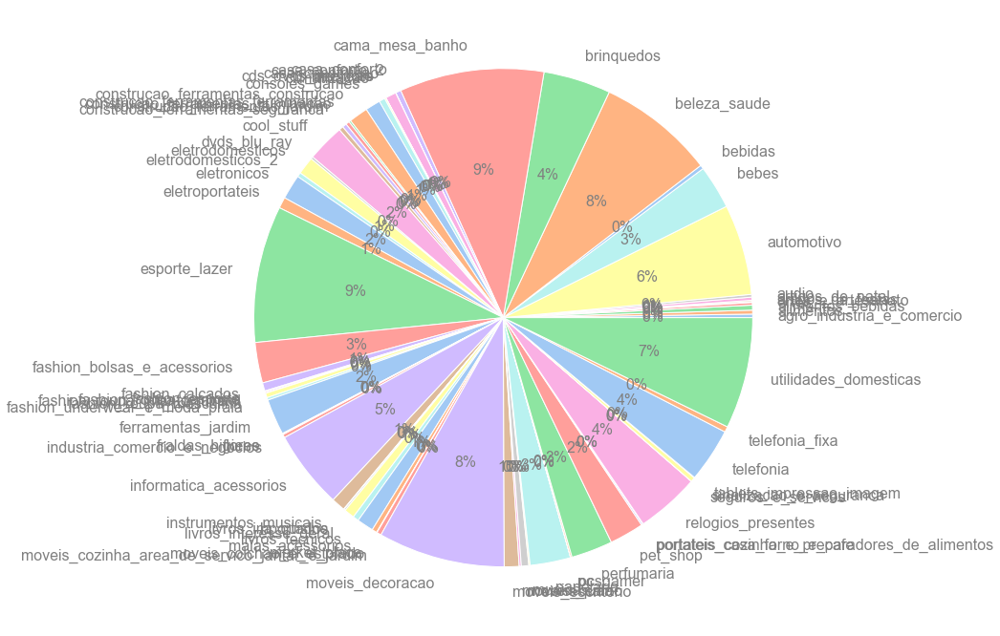

In [30]:
# Le nombre de produits par catégorie
products_categ= products.groupby('product_category_name').count()['product_id']

colors = sns.color_palette('pastel')
fig, ax = plt.subplots(figsize=(12, 12))
plt.pie(products_categ, labels=products_categ.index.tolist(), colors = colors, autopct = '%0.0f%%', textprops = {'color': 'Gray','fontsize':16})
plt.show()

In [31]:
order_items = pd.merge(order_items, products[['product_id', 'product_category_name']], how='inner', on=['product_id'])
order_items

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29,cool_stuff
1,130898c0987d1801452a8ed92a670612,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-07-05 02:44:11,55.9,17.96,cool_stuff
2,532ed5e14e24ae1f0d735b91524b98b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2018-05-23 10:56:25,64.9,18.33,cool_stuff
3,6f8c31653edb8c83e1a739408b5ff750,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-07 18:55:08,58.9,16.17,cool_stuff
4,7d19f4ef4d04461989632411b7e588b9,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-08-16 22:05:11,58.9,13.29,cool_stuff
...,...,...,...,...,...,...,...,...
111042,ffebd80e3291e811c308365936897efd,1,4cc4d02efc8f249c13355147fb44e34d,d1c7fa84e48cfa21a0e595167c1c500e,2018-07-18 20:23:55,129.9,51.20,ferramentas_jardim
111043,ffee31fb4b5e35c9123608015637c495,1,b10ecf8e33aaaea419a9fa860ea80fb5,0241d4d5d36f10f80c644447315af0bd,2018-08-21 10:10:11,99.0,13.52,moveis_decoracao
111044,fff7c4452f050315db1b3f24d9df5fcd,1,dd469c03ad67e201bc2179ef077dcd48,7e93a43ef30c4f03f38b393420bc753a,2017-06-07 17:05:23,736.0,20.91,relogios_presentes
111045,fffa82886406ccf10c7b4e35c4ff2788,1,bbe7651fef80287a816ead73f065fc4b,8f2ce03f928b567e3d56181ae20ae952,2017-12-22 17:31:42,229.9,44.02,esporte_lazer


Sum the prices

In [32]:
order_prices = order_items[['order_id','price', 'freight_value']].groupby('order_id').sum().reset_index(level=0)
order_prices = pd.merge(order_prices, order_items.loc[order_items['order_item_id']==1,['order_id', 'product_category_name']], how='inner', on=['order_id'])
order_prices.sort_values(by='price', ascending=False)

,order_id,price,freight_value,product_category_name
1432,03caa2c082116e1d31e67e9ae3700499,13440.00,224.08,telefonia_fixa
43827,736e1922ae60d0d6a89247b851902527,7160.00,114.88,telefonia_fixa
3087,0812eb902a67711a1cb742b3cdaa65ae,6735.00,194.31,utilidades_domesticas
96887,fefacc66af859508bf1a7934eab1e97f,6729.00,193.21,pcs
93081,f5136e38d1a14a4dbd87dff67da82701,6499.00,227.66,artes
...,...,...,...,...
21475,38bcb524e1c38c2c1b60600a80fc8999,2.90,8.72,pet_shop
88475,e8bbc1d69fee39eee4c72cb5c969e39d,2.29,7.78,papelaria
91871,f1d5c2e6867fa93ceee9ef9b34a53cbf,2.20,7.39,beleza_saude
41956,6e864b3f0ec71031117ad4cf46b7f2a1,0.85,18.23,construcao_ferramentas_construcao


## df = Customers x Orders x Orders Prices x Orders Volumes

In [33]:
df = pd.merge(df, order_prices, how='inner', on=['order_id'])
df = pd.merge(df, orders_volume, how='inner', on=['order_id'])
print('Doublons :', len(doublons(df['order_id'])))
df

Doublons : 0


,customer_unique_id,customer_state,order_id,order_purchase_timestamp,daytime,weekday,month,price,freight_value,product_category_name,orders_volume
0,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,3.0,5.0,10.0,124.99,21.88,moveis_escritorio,1
1,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2.0,2.0,4.0,289.00,46.48,utilidades_domesticas,1
2,060e732b5b29e8181a18229c7b0b2b5e,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,3.0,0.0,10.0,139.94,17.79,moveis_escritorio,1
3,259dac757896d24d7702b9acbbff3f3c,SP,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,3.0,5.0,8.0,149.94,23.36,moveis_escritorio,1
4,345ecd01c38d18a9036ed96c73b8d066,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,1.0,1.0,9.0,230.00,22.25,casa_conforto,1
...,...,...,...,...,...,...,...,...,...,...,...
95114,1a29b476fee25c95fbafc67c5ac95cf8,SP,6760e20addcf0121e9d58f2f1ff14298,2018-04-07 15:48:17,3.0,0.0,6.0,74.90,13.88,livros_interesse_geral,1
95115,d52a67c98be1cf6a5c84435bd38d095d,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,2018-04-04 08:20:22,1.0,4.0,6.0,114.90,14.16,esporte_lazer,1
95116,e9f50caf99f032f0bf3c55141f019d99,other,fed4434add09a6f332ea398efd656a5c,2018-04-08 20:11:50,2.0,1.0,6.0,37.00,19.04,beleza_saude,1
95117,73c2643a0a458b49f58cea58833b192e,RS,e31ec91cea1ecf97797787471f98a8c2,2017-11-03 21:08:33,2.0,2.0,3.0,689.00,22.07,relogios_presentes,1


In [34]:
# Le nombre de commandes par catégorie
orders_categ= df.groupby('product_category_name').sum()['orders_volume']
categ = pd.merge(products_categ, orders_categ, how='inner', on=['product_category_name'])

# Le montant total des commandes par catégorie
orders_categ= df.groupby('product_category_name').sum()['price']
categ = pd.merge(categ, orders_categ, how='inner', on=['product_category_name'])
categ

,product_id,orders_volume,price
product_category_name,,,
agro_industria_e_comercio,74,210,70566.10
alimentos,82,498,28354.39
alimentos_bebidas,104,280,14873.57
artes,55,197,23233.13
artes_e_artesanato,19,26,1804.92
...,...,...,...
sinalizacao_e_seguranca,93,206,21394.95
tablets_impressao_imagem,9,83,7382.41
telefonia,1134,4531,310120.25


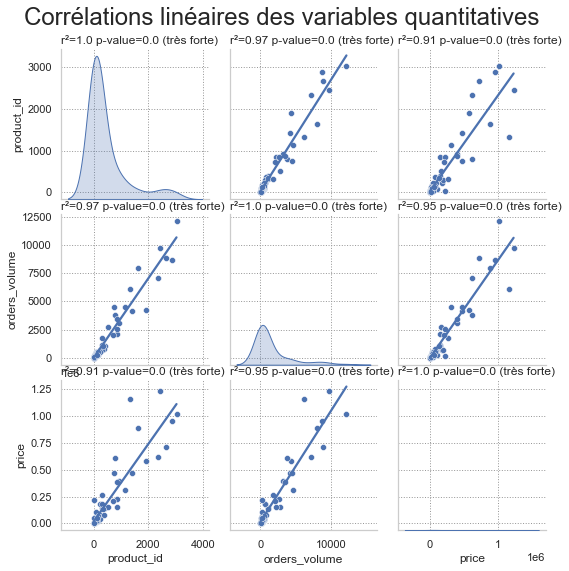

In [35]:
afficher_correlations(categ)

## Orders Payments

In [36]:
order_payments = pd.read_csv('olist_order_payments_dataset.csv', low_memory=low_memory)
order_payments#sort_values(by='payment_sequential', ascending=False)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45
...,...,...,...,...,...
103881,0406037ad97740d563a178ecc7a2075c,1,boleto,1,363.31
103882,7b905861d7c825891d6347454ea7863f,1,credit_card,2,96.80
103883,32609bbb3dd69b3c066a6860554a77bf,1,credit_card,1,47.77
103884,b8b61059626efa996a60be9bb9320e10,1,credit_card,5,369.54


In [37]:
order_payments.groupby('order_id').sum().sort_values(by='payment_value', ascending=False)

,payment_sequential,payment_installments,payment_value
order_id,,,
03caa2c082116e1d31e67e9ae3700499,1,1,13664.08
736e1922ae60d0d6a89247b851902527,1,1,7274.88
0812eb902a67711a1cb742b3cdaa65ae,1,8,6929.31
fefacc66af859508bf1a7934eab1e97f,1,1,6922.21
f5136e38d1a14a4dbd87dff67da82701,1,1,6726.66
...,...,...,...
e8bbc1d69fee39eee4c72cb5c969e39d,1,1,10.07
f1d5c2e6867fa93ceee9ef9b34a53cbf,3,2,9.59
c8c528189310eaa44a745b8d9d26908b,1,1,0.00


In [38]:
order_payments[order_payments['payment_sequential']>1].sort_values(by=['order_id', 'payment_sequential'], ascending=False).head(10)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
28537,ffc730a0615d28ec19f9cad02cb41442,2,credit_card,1,12.63
3009,ffa39020fe7c8a3e907320e1bec4b985,2,voucher,1,64.01
21648,ffa1dd97810de91a03abd7bd76d2fed1,2,voucher,1,418.73
11583,ff978de32e717acd3b5abe1fb069d2b6,4,voucher,1,7.68
28611,ff978de32e717acd3b5abe1fb069d2b6,3,voucher,1,0.66
26914,ff978de32e717acd3b5abe1fb069d2b6,2,voucher,1,10.80
96028,ff7400d904161b62b6e830b3988f5cbd,2,voucher,1,100.00
24664,ff20ee702706d9e407a34de9fe2ff768,2,voucher,1,50.00
95767,ff1f8f328e5a59ac754240b6dd31bcb4,4,voucher,1,26.03
75488,ff1f8f328e5a59ac754240b6dd31bcb4,3,voucher,1,142.58


## Payments

In [39]:
payments = order_payments[['order_id', 'payment_sequential', 'payment_installments', 'payment_value']].groupby('order_id').agg({'payment_sequential':'max', 'payment_installments': 'max', 'payment_value': 'sum'}).reset_index(level=0)
payments.sort_values('payment_sequential', ascending=False)

,order_id,payment_sequential,payment_installments,payment_value
97261,fa65dad1b0e818e3ccc5cb0e39231352,29,1,457.99
79611,ccf804e764ed5650cd8759557269dc13,26,1,62.68
15577,285c2e15bebd4ac83635ccc563dc71f4,22,1,40.85
53168,895ab968e7bb0d5659d16cd74cd1650c,21,1,161.32
92724,ee9ca989fc93ba09a6eddc250ce01742,19,1,82.73
...,...,...,...,...
33713,56ca2955a23551796d37da2e384c7139,1,1,30.10
33712,56c9b97f31031c70ffb000219dc6f403,1,8,163.81
33711,56c93a3f93a1e7eb24ed51a6931dc488,1,1,933.70
33710,56c898abec8a6fd5e84ffc42904c4f65,1,10,478.33


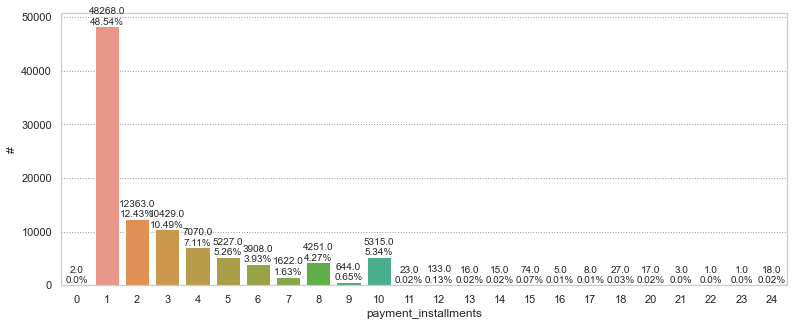

In [40]:
payment_installments = payments.groupby('payment_installments').count()['order_id']
barplot(x=payment_installments.index.tolist(), y=payment_installments, ylabel='#', xlabel='payment_installments', width=13)

In [41]:
payments.loc[payments['payment_installments']==0, :]

,order_id,payment_sequential,payment_installments,payment_value
10244,1a57108394169c0b47d8f876acc9ba2d,2,0,129.94
45168,744bade1fcf9ff3f31d860ace076d422,2,0,58.69


In [42]:
payments.loc[payments['payment_installments']==0, 'payment_installments'] = 1

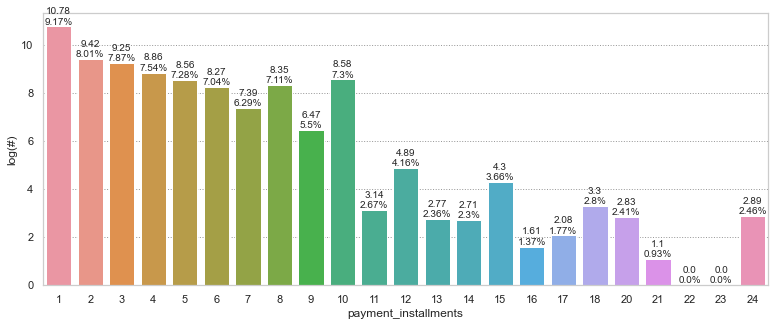

In [43]:
payment_installments = payments.groupby('payment_installments').count()['order_id']
barplot(x=payment_installments.index.tolist(), y=np.log(payment_installments), ylabel='log(#)', xlabel='payment_installments', width=13)

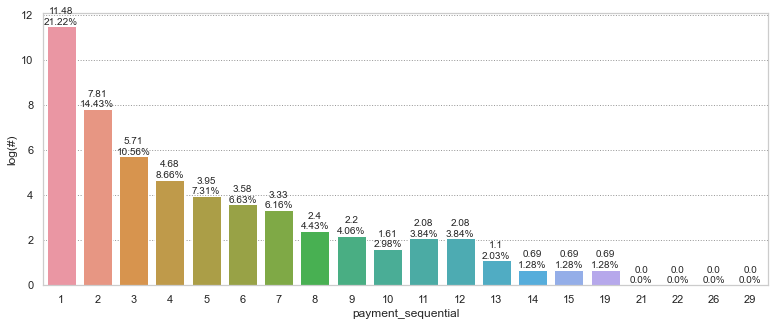

In [44]:
payment_sequential = payments.groupby('payment_sequential').count()['order_id']
barplot(x=payment_sequential.index.tolist(), y=np.log(payment_sequential), ylabel='log(#)', xlabel='payment_sequential', width=13)

## Payements Type

In [45]:
payment_type = order_payments[['order_id','payment_type']].drop_duplicates(subset='order_id')
payment_type

,order_id,payment_type
0,b81ef226f3fe1789b1e8b2acac839d17,credit_card
1,a9810da82917af2d9aefd1278f1dcfa0,credit_card
2,25e8ea4e93396b6fa0d3dd708e76c1bd,credit_card
3,ba78997921bbcdc1373bb41e913ab953,credit_card
4,42fdf880ba16b47b59251dd489d4441a,credit_card
...,...,...
103881,0406037ad97740d563a178ecc7a2075c,boleto
103882,7b905861d7c825891d6347454ea7863f,credit_card
103883,32609bbb3dd69b3c066a6860554a77bf,credit_card
103884,b8b61059626efa996a60be9bb9320e10,credit_card


In [46]:
payment_type['payment_type'].unique()

array(['credit_card', 'boleto', 'voucher', 'debit_card', 'not_defined'],
      dtype=object)

In [47]:
payment_type[payment_type['payment_type']=='not_defined']

,order_id,payment_type
51280,4637ca194b6387e2d538dc89b124b0ee,not_defined
57411,00b1cb0320190ca0daa2c88b35206009,not_defined
94427,c8c528189310eaa44a745b8d9d26908b,not_defined


In [48]:
payment_type = payment_type[payment_type['payment_type']!='not_defined']

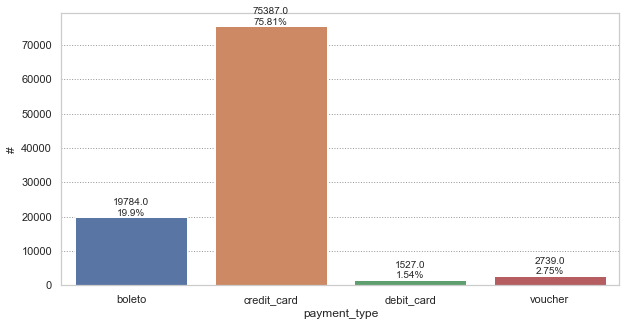

In [49]:
ptypes = payment_type.groupby('payment_type').count()['order_id']
ptypes_name = ptypes.index.tolist()

barplot(x=ptypes_name, y=ptypes, ylabel='#', xlabel='payment_type')

## df = Customers x Orders x Orders Prices x Payements x Payements Type

In [50]:
df = pd.merge(df, payments, how='inner', on=['order_id'])
df = pd.merge(df, payment_type, how='inner', on=['order_id'])
df = df.drop(columns=['price', 'freight_value'])
print('Doublons :', len(doublons(df['order_id'])))
df

Doublons : 0


,customer_unique_id,customer_state,order_id,order_purchase_timestamp,daytime,weekday,month,product_category_name,orders_volume,payment_sequential,payment_installments,payment_value,payment_type
0,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,3.0,5.0,10.0,moveis_escritorio,1,1,2,146.87,credit_card
1,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2.0,2.0,4.0,utilidades_domesticas,1,1,8,335.48,credit_card
2,060e732b5b29e8181a18229c7b0b2b5e,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,3.0,0.0,10.0,moveis_escritorio,1,1,7,157.73,credit_card
3,259dac757896d24d7702b9acbbff3f3c,SP,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,3.0,5.0,8.0,moveis_escritorio,1,1,1,173.30,credit_card
4,345ecd01c38d18a9036ed96c73b8d066,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,1.0,1.0,9.0,casa_conforto,1,1,8,252.25,credit_card
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95113,1a29b476fee25c95fbafc67c5ac95cf8,SP,6760e20addcf0121e9d58f2f1ff14298,2018-04-07 15:48:17,3.0,0.0,6.0,livros_interesse_geral,1,1,6,88.78,credit_card
95114,d52a67c98be1cf6a5c84435bd38d095d,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,2018-04-04 08:20:22,1.0,4.0,6.0,esporte_lazer,1,1,3,129.06,credit_card
95115,e9f50caf99f032f0bf3c55141f019d99,other,fed4434add09a6f332ea398efd656a5c,2018-04-08 20:11:50,2.0,1.0,6.0,beleza_saude,1,1,5,56.04,credit_card
95116,73c2643a0a458b49f58cea58833b192e,RS,e31ec91cea1ecf97797787471f98a8c2,2017-11-03 21:08:33,2.0,2.0,3.0,relogios_presentes,1,1,2,711.07,credit_card


## Reviews

In [51]:
reviews = pd.read_csv('olist_order_reviews_dataset.csv', low_memory=low_memory)
print('Doublons :', len(doublons(reviews['order_id'])))
reviews = reviews[['order_id', 'review_score']].groupby('order_id').mean().reset_index(level=0)
print('Doublons :', len(doublons(reviews['order_id'])))
reviews

Doublons : 551
Doublons : 0


,order_id,review_score
0,00010242fe8c5a6d1ba2dd792cb16214,5.0
1,00018f77f2f0320c557190d7a144bdd3,4.0
2,000229ec398224ef6ca0657da4fc703e,5.0
3,00024acbcdf0a6daa1e931b038114c75,4.0
4,00042b26cf59d7ce69dfabb4e55b4fd9,5.0
...,...,...
98668,fffc94f6ce00a00581880bf54a75a037,5.0
98669,fffcd46ef2263f404302a634eb57f7eb,5.0
98670,fffce4705a9662cd70adb13d4a31832d,5.0
98671,fffe18544ffabc95dfada21779c9644f,5.0


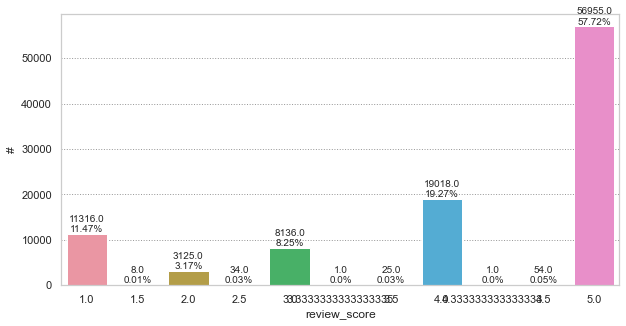

In [52]:
review_scores = reviews.groupby('review_score').count().iloc[:,0]
barplot(x=review_scores.index.tolist(), y=review_scores, ylabel='#', xlabel='review_score')

In [53]:
reviews['review_score'] = reviews['review_score'].astype(int)

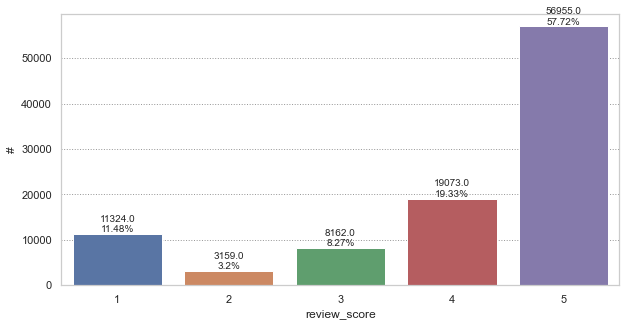

In [54]:
review_scores = reviews.groupby('review_score').count().iloc[:,0]
barplot(x=review_scores.index.tolist(), y=review_scores, ylabel='#', xlabel='review_score')

## df = Customers x Orders x Orders Prices x Payements x Payements Type x Reviews

In [55]:
df = pd.merge(df, reviews[['order_id', 'review_score']], how='inner', on=['order_id'])
print('Doublons :', len(doublons(df['order_id'])))
df

Doublons : 0


,customer_unique_id,customer_state,order_id,order_purchase_timestamp,daytime,weekday,month,product_category_name,orders_volume,payment_sequential,payment_installments,payment_value,payment_type,review_score
0,861eff4711a542e4b93843c6dd7febb0,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,3.0,5.0,10.0,moveis_escritorio,1,1,2,146.87,credit_card,4
1,290c77bc529b7ac935b93aa66c333dc3,SP,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2.0,2.0,4.0,utilidades_domesticas,1,1,8,335.48,credit_card,5
2,060e732b5b29e8181a18229c7b0b2b5e,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,3.0,0.0,10.0,moveis_escritorio,1,1,7,157.73,credit_card,5
3,259dac757896d24d7702b9acbbff3f3c,SP,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,3.0,5.0,8.0,moveis_escritorio,1,1,1,173.30,credit_card,5
4,345ecd01c38d18a9036ed96c73b8d066,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,1.0,1.0,9.0,casa_conforto,1,1,8,252.25,credit_card,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94476,1a29b476fee25c95fbafc67c5ac95cf8,SP,6760e20addcf0121e9d58f2f1ff14298,2018-04-07 15:48:17,3.0,0.0,6.0,livros_interesse_geral,1,1,6,88.78,credit_card,4
94477,d52a67c98be1cf6a5c84435bd38d095d,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,2018-04-04 08:20:22,1.0,4.0,6.0,esporte_lazer,1,1,3,129.06,credit_card,5
94478,e9f50caf99f032f0bf3c55141f019d99,other,fed4434add09a6f332ea398efd656a5c,2018-04-08 20:11:50,2.0,1.0,6.0,beleza_saude,1,1,5,56.04,credit_card,1
94479,73c2643a0a458b49f58cea58833b192e,RS,e31ec91cea1ecf97797787471f98a8c2,2017-11-03 21:08:33,2.0,2.0,3.0,relogios_presentes,1,1,2,711.07,credit_card,5


In [56]:
len(doublons(df['customer_unique_id']))

3005

## Agrégation Commandes par Client

In [57]:
# Sauvgarde des dates des commandes les plus récentes par client
orders_freshness = df.groupby('customer_unique_id').max().reset_index(level=0)[['customer_unique_id', 'order_purchase_timestamp']]
orders_freshness['timestamp'] = orders_freshness['order_purchase_timestamp']
orders_freshness['order_purchase_timestamp']= MinMax_Scaled(pd.DataFrame(orders_freshness['order_purchase_timestamp']))
orders_freshness

,customer_unique_id,order_purchase_timestamp,timestamp
0,0000366f3b9a7992bf8c76cfdf3221e2,0.840025,2018-05-10 10:56:27
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.835723,2018-05-07 11:11:27
2,0000f46a3911fa3c0805444483337064,0.227613,2017-03-10 21:05:03
3,0000f6ccb0745a6a4b88665a16c9f078,0.538405,2017-10-12 20:29:41
4,0004aac84e0df4da2b147fca70cf8255,0.585848,2017-11-14 19:45:42
...,...,...,...
91471,fffcf5a5ff07b0908bd4e2dbc735a684,0.357120,2017-06-08 21:00:36
91472,fffea47cd6d3cc0a88bd621562a9d061,0.623285,2017-12-10 20:07:56
91473,ffff371b4d645b6ecea244b27531430a,0.182688,2017-02-07 15:49:16
91474,ffff5962728ec6157033ef9805bacc48,0.828774,2018-05-02 15:17:41


In [58]:
# Agregation des infos clients par la somme
dfe = df.groupby('customer_unique_id').sum().reset_index(level=0)
dfe

,customer_unique_id,daytime,weekday,month,orders_volume,payment_sequential,payment_installments,payment_value,review_score
0,0000366f3b9a7992bf8c76cfdf3221e2,1.0,3.0,10.0,1,1,8,141.90,5
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1.0,6.0,10.0,1,1,1,27.19,4
2,0000f46a3911fa3c0805444483337064,2.0,2.0,8.0,1,1,8,86.22,3
3,0000f6ccb0745a6a4b88665a16c9f078,2.0,3.0,1.0,1,1,4,43.62,4
4,0004aac84e0df4da2b147fca70cf8255,2.0,5.0,3.0,1,1,6,196.89,5
...,...,...,...,...,...,...,...,...,...
91471,fffcf5a5ff07b0908bd4e2dbc735a684,2.0,3.0,7.0,3,1,10,2067.42,5
91472,fffea47cd6d3cc0a88bd621562a9d061,2.0,1.0,2.0,1,1,1,84.58,4
91473,ffff371b4d645b6ecea244b27531430a,3.0,5.0,5.0,1,1,1,112.46,5
91474,ffff5962728ec6157033ef9805bacc48,3.0,4.0,10.0,1,1,5,133.69,5


In [59]:
# Fréquence des commandes
multi_orders = df.groupby('customer_unique_id').count().reset_index(level=0)[['customer_unique_id', 'order_id']]
multi_orders = renameCol(multi_orders, 'order_id', 'multi_orders')

In [60]:
dfe = pd.merge(dfe, multi_orders, how='inner', on=['customer_unique_id'])
dfe = pd.merge(orders_freshness[['customer_unique_id', 'order_purchase_timestamp']], dfe, how='inner', on=['customer_unique_id'])
dfe

,customer_unique_id,order_purchase_timestamp,daytime,weekday,month,orders_volume,payment_sequential,payment_installments,payment_value,review_score,multi_orders
0,0000366f3b9a7992bf8c76cfdf3221e2,0.840025,1.0,3.0,10.0,1,1,8,141.90,5,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.835723,1.0,6.0,10.0,1,1,1,27.19,4,1
2,0000f46a3911fa3c0805444483337064,0.227613,2.0,2.0,8.0,1,1,8,86.22,3,1
3,0000f6ccb0745a6a4b88665a16c9f078,0.538405,2.0,3.0,1.0,1,1,4,43.62,4,1
4,0004aac84e0df4da2b147fca70cf8255,0.585848,2.0,5.0,3.0,1,1,6,196.89,5,1
...,...,...,...,...,...,...,...,...,...,...,...
91471,fffcf5a5ff07b0908bd4e2dbc735a684,0.357120,2.0,3.0,7.0,3,1,10,2067.42,5,1
91472,fffea47cd6d3cc0a88bd621562a9d061,0.623285,2.0,1.0,2.0,1,1,1,84.58,4,1
91473,ffff371b4d645b6ecea244b27531430a,0.182688,3.0,5.0,5.0,1,1,1,112.46,5,1
91474,ffff5962728ec6157033ef9805bacc48,0.828774,3.0,4.0,10.0,1,1,5,133.69,5,1


In [61]:
# Moyenner les infos payement & review sur les multi-commandes
cols = colsOfType(df)
for col in cols:
    dfe[col] = dfe[col]//dfe['multi_orders']

# Binarisation de la fréquence d'achat (1: multi, 0: 1)
dfe['multi_orders'] = dfe['multi_orders'].apply(lambda x : min(x-1, 1))

# Renommer & Réordonnerles colonnes RFM
old_cols = ['review_score', 'payment_value', 'multi_orders', 'order_purchase_timestamp' ]
new_cols = ['review_score(S)', 'payment_value(M)', 'multi_orders(F)', 'Freshness(R)']
for i in range(len(old_cols)):
    dfe = renameCol(dfe, old_cols[i], new_cols[i])    
    col = dfe.pop(new_cols[i])
    dfe.insert(1, col.name, col)

dfe

,customer_unique_id,Freshness(R),multi_orders(F),payment_value(M),review_score(S),daytime,weekday,month,orders_volume,payment_sequential,payment_installments
0,0000366f3b9a7992bf8c76cfdf3221e2,0.840025,0,141.0,5,1.0,3.0,10.0,1,1,8
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.835723,0,27.0,4,1.0,6.0,10.0,1,1,1
2,0000f46a3911fa3c0805444483337064,0.227613,0,86.0,3,2.0,2.0,8.0,1,1,8
3,0000f6ccb0745a6a4b88665a16c9f078,0.538405,0,43.0,4,2.0,3.0,1.0,1,1,4
4,0004aac84e0df4da2b147fca70cf8255,0.585848,0,196.0,5,2.0,5.0,3.0,1,1,6
...,...,...,...,...,...,...,...,...,...,...,...
91471,fffcf5a5ff07b0908bd4e2dbc735a684,0.357120,0,2067.0,5,2.0,3.0,7.0,3,1,10
91472,fffea47cd6d3cc0a88bd621562a9d061,0.623285,0,84.0,4,2.0,1.0,2.0,1,1,1
91473,ffff371b4d645b6ecea244b27531430a,0.182688,0,112.0,5,3.0,5.0,5.0,1,1,1
91474,ffff5962728ec6157033ef9805bacc48,0.828774,0,133.0,5,3.0,4.0,10.0,1,1,5


In [62]:
df = pd.merge(dfe[dfe.columns[:9].tolist()], df.groupby('customer_unique_id').first().reset_index(level=0)[['customer_unique_id', 'product_category_name', 'payment_type', 'payment_sequential', 'payment_installments', 'customer_state']], how='right', on=['customer_unique_id'])
df

,customer_unique_id,Freshness(R),multi_orders(F),payment_value(M),review_score(S),daytime,weekday,month,orders_volume,product_category_name,payment_type,payment_sequential,payment_installments,customer_state
0,0000366f3b9a7992bf8c76cfdf3221e2,0.840025,0,141.0,5,1.0,3.0,10.0,1,cama_mesa_banho,credit_card,1,8,SP
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.835723,0,27.0,4,1.0,6.0,10.0,1,beleza_saude,credit_card,1,1,SP
2,0000f46a3911fa3c0805444483337064,0.227613,0,86.0,3,2.0,2.0,8.0,1,papelaria,credit_card,1,8,other
3,0000f6ccb0745a6a4b88665a16c9f078,0.538405,0,43.0,4,2.0,3.0,1.0,1,telefonia,credit_card,1,4,other
4,0004aac84e0df4da2b147fca70cf8255,0.585848,0,196.0,5,2.0,5.0,3.0,1,telefonia,credit_card,1,6,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91471,fffcf5a5ff07b0908bd4e2dbc735a684,0.357120,0,2067.0,5,2.0,3.0,7.0,3,beleza_saude,credit_card,1,10,other
91472,fffea47cd6d3cc0a88bd621562a9d061,0.623285,0,84.0,4,2.0,1.0,2.0,1,bebes,credit_card,1,1,other
91473,ffff371b4d645b6ecea244b27531430a,0.182688,0,112.0,5,3.0,5.0,5.0,1,automotivo,credit_card,1,1,other
91474,ffff5962728ec6157033ef9805bacc48,0.828774,0,133.0,5,3.0,4.0,10.0,1,relogios_presentes,credit_card,1,5,other


In [63]:
df.loc[df['payment_value(M)']<100, 'payment_value(M)'] = 1
df.loc[(df['payment_value(M)']>=100) & (df['payment_value(M)']<1000), 'payment_value(M)'] = 2
for i in range (1,10):
    df.loc[(df['payment_value(M)']>=1000*i) & (df['payment_value(M)']<1000*(i+1)), 'payment_value(M)'] = 2 + i
df.loc[df['payment_value(M)']>9, 'payment_value(M)'] = 10

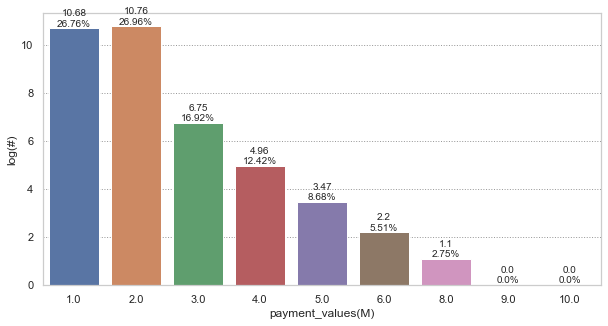

In [64]:
payment_values = df.groupby('payment_value(M)').count().iloc[:,0]
barplot(x=payment_values.index.tolist(), y=np.log(payment_values), ylabel='log(#)', xlabel='payment_values(M)')

## Oridnal Encoding

In [65]:
dfe = pd.merge(df, products_categ, how='left', on='product_category_name')
dfe = pd.merge(dfe, customers.groupby('customer_state').count()['customer_unique_id'], how='left', on='customer_state')
dfe = pd.merge(dfe, ptypes, how='left', on='payment_type')
dfe = dfe.drop(columns=['product_category_name', 'payment_type', 'customer_state'])
dfe = dfe.rename(columns={'customer_unique_id_x':'customer_unique_id', 'product_id':'pcateg', 'customer_unique_id_y':'customer_state', 'order_id':'payment_type'})

for col in ['pcateg', 'customer_state', 'payment_type']:
    dfe = OrdinalEncoding(dfe, col)
dfe

,customer_unique_id,Freshness(R),multi_orders(F),payment_value(M),review_score(S),daytime,weekday,month,orders_volume,payment_sequential,payment_installments,pcateg,customer_state,payment_type
0,0000366f3b9a7992bf8c76cfdf3221e2,0.840025,0,2.0,5,1.0,3.0,10.0,1,1,8,63.0,5.0,3.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.835723,0,1.0,4,1.0,6.0,10.0,1,1,1,62.0,5.0,3.0
2,0000f46a3911fa3c0805444483337064,0.227613,0,1.0,3,2.0,2.0,8.0,1,1,8,55.0,4.0,3.0
3,0000f6ccb0745a6a4b88665a16c9f078,0.538405,0,1.0,4,2.0,3.0,1.0,1,1,4,56.0,4.0,3.0
4,0004aac84e0df4da2b147fca70cf8255,0.585848,0,2.0,5,2.0,5.0,3.0,1,1,6,56.0,5.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91471,fffcf5a5ff07b0908bd4e2dbc735a684,0.357120,0,4.0,5,2.0,3.0,7.0,3,1,10,62.0,4.0,3.0
91472,fffea47cd6d3cc0a88bd621562a9d061,0.623285,0,1.0,4,2.0,1.0,2.0,1,1,1,49.0,4.0,3.0
91473,ffff371b4d645b6ecea244b27531430a,0.182688,0,2.0,5,3.0,5.0,5.0,1,1,1,54.0,4.0,3.0
91474,ffff5962728ec6157033ef9805bacc48,0.828774,0,2.0,5,3.0,4.0,10.0,1,1,5,57.0,4.0,3.0


Le data set contient :
	- 91476 lignes et 14 colonnes.
	- 0 valeurs manquantes, ce qui représente 0.0 % du data set.
Voici un sous-échantillon aléatoire :


,customer_unique_id,Freshness(R),multi_orders(F),payment_value(M),review_score(S),daytime,weekday,month,orders_volume,product_category_name,payment_type,payment_sequential,payment_installments,customer_state
10123,1c0cebef9716e58116c406641c5f471b,0.845782,0,1.0,4,1.0,6.0,10.0,1,eletroportateis,credit_card,1,1,RJ
73712,ce128a731e25fed87a7ace92333b142f,0.673663,0,2.0,5,2.0,1.0,4.0,1,papelaria,credit_card,1,6,SP
38190,6a991210c0515ba129062bf598c7dbab,0.701905,0,2.0,5,1.0,0.0,5.0,2,perfumaria,credit_card,1,10,RJ
21845,3cf2a3ab991db5237c12edb31243bdb1,0.922171,0,1.0,5,3.0,2.0,9.0,1,moveis_decoracao,credit_card,1,4,MG
1879,0529c2166947dc1e4012efdff2b9b8cf,0.953850,0,1.0,4,3.0,0.0,9.0,1,utilidades_domesticas,boleto,1,1,MG
25891,4843cf220ea88410bfaf0dcd3760e480,0.665787,0,1.0,5,1.0,5.0,4.0,1,telefonia,credit_card,1,2,PR
54397,98278b047cb28052979c255068136405,0.840731,0,2.0,4,2.0,3.0,10.0,1,informatica_acessorios,credit_card,1,2,MG
86558,f22107767172fbb6d8b0fb8b2229522f,0.492146,0,2.0,5,3.0,1.0,0.0,1,cama_mesa_banho,credit_card,1,10,RJ
4389,0c0e619b6900528d76f8b95a28bd6af0,0.437702,0,2.0,5,2.0,3.0,11.0,1,esporte_lazer,credit_card,1,3,RJ
23874,42c4318adb7826297293f237ece3523c,0.468688,0,2.0,5,1.0,2.0,11.0,1,cool_stuff,credit_card,1,10,PR


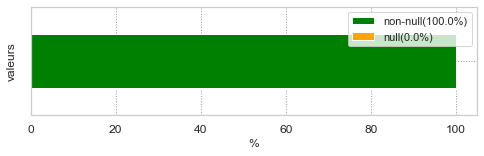

In [66]:
verifier_taille(df)
afficher_echantillon(df, 10)

# Analyse Exploratoire

## Distributions

In [67]:
dfe.describe()

,Freshness(R),multi_orders(F),payment_value(M),review_score(S),daytime,weekday,month,orders_volume,payment_sequential,payment_installments,pcateg,customer_state,payment_type
count,91476.000000,91476.000000,91476.000000,91476.000000,91476.000000,91476.000000,91476.000000,91476.000000,91476.000000,91476.000000,91476.000000,91476.000000,91476.000000
mean,0.659525,0.029571,1.539683,4.151624,2.046952,3.250077,6.387315,1.188027,1.044602,2.916131,53.964942,3.686267,2.701780
std,0.219601,0.169400,0.534249,1.280078,0.916291,1.942089,3.226861,0.829505,0.368061,2.702679,9.553646,1.495944,0.595534
min,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000
25%,0.503616,0.000000,1.000000,4.000000,1.000000,2.000000,4.000000,1.000000,1.000000,1.000000,51.000000,3.000000,3.000000
50%,0.686976,0.000000,2.000000,5.000000,2.000000,3.000000,7.000000,1.000000,1.000000,2.000000,57.000000,4.000000,3.000000
75%,0.837279,0.000000,2.000000,5.000000,3.000000,5.000000,9.000000,1.000000,1.000000,4.000000,61.000000,5.000000,3.000000
max,1.000000,1.000000,10.000000,5.000000,3.000000,6.000000,11.000000,52.000000,26.000000,24.000000,63.000000,5.000000,3.000000


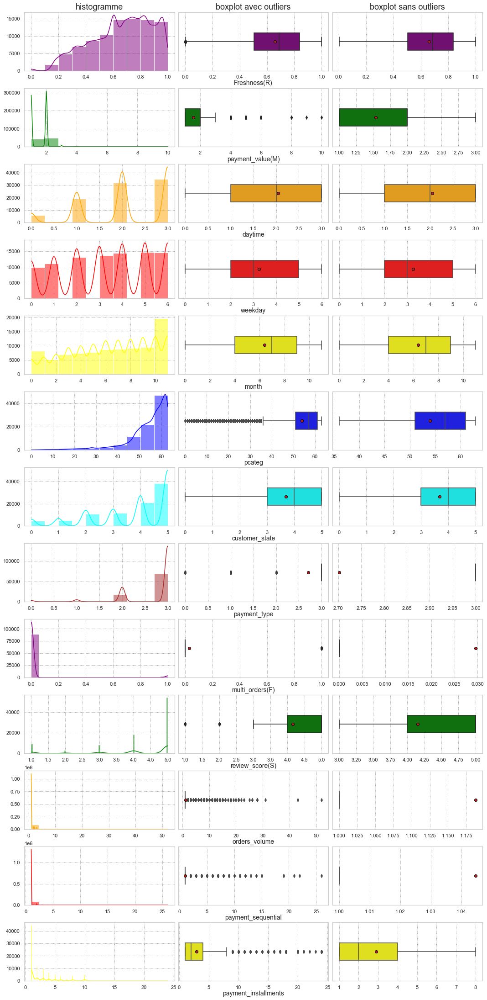

In [68]:
histo_distribution(dfe)

## Correlaions

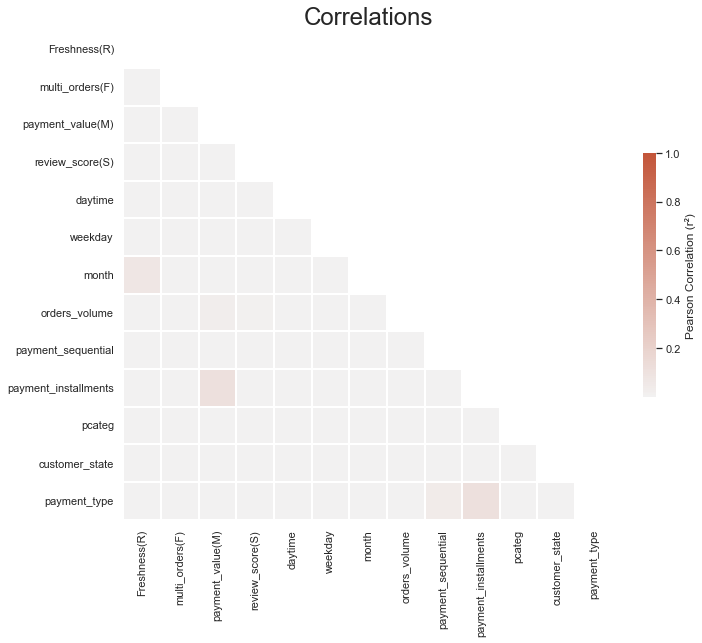

In [69]:
correlation_matrix(dfe)

## ANOVA

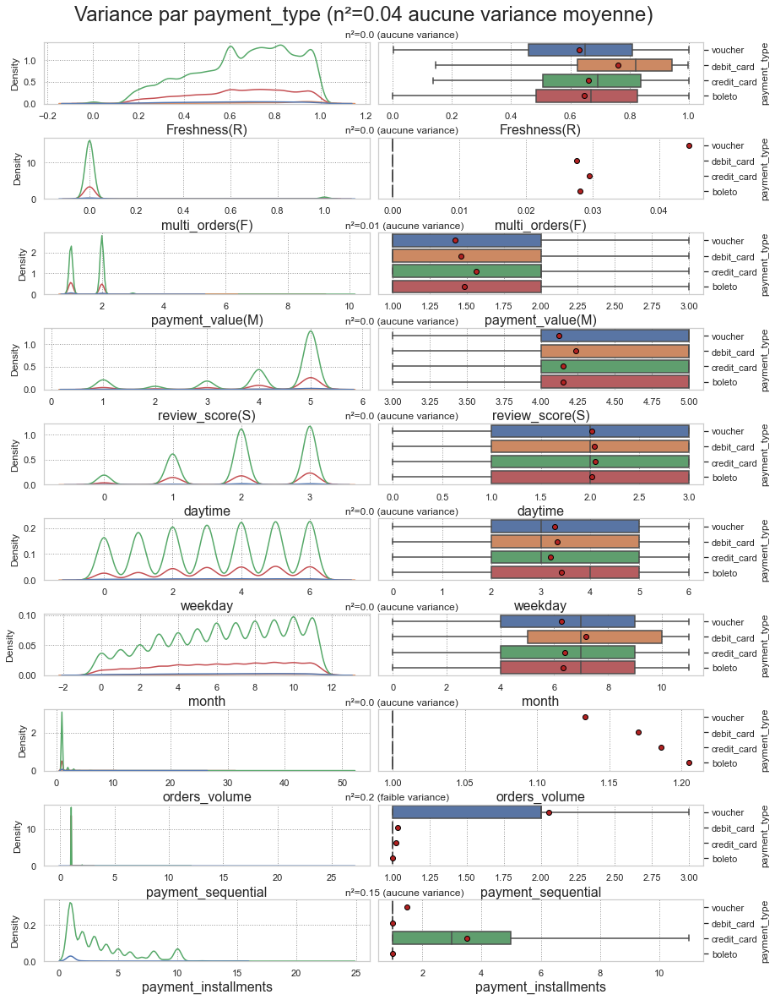

In [70]:
X = 'payment_type'
ANOVA(df, X, yloc=0.91, hspace=0.55, width=7, heigth=0.5)

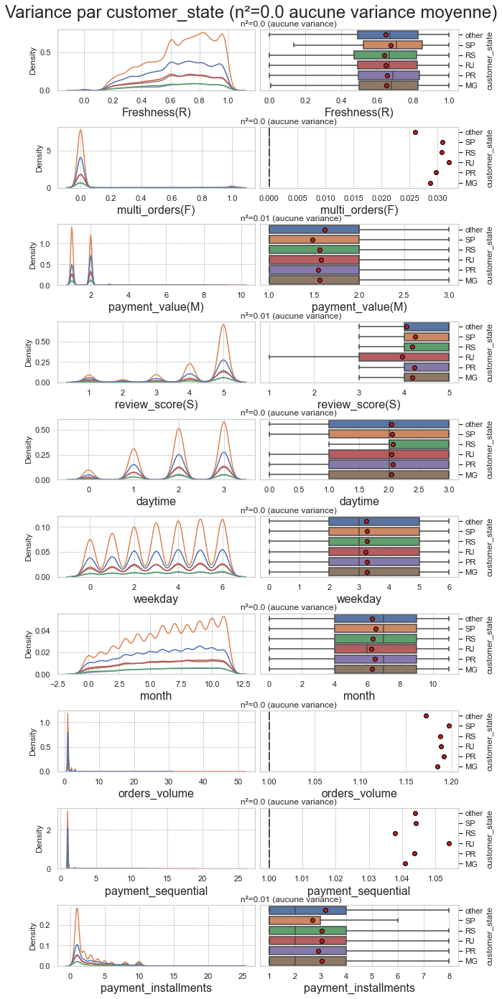

In [71]:
X = 'customer_state'
ANOVA(df, X, yloc=0.9, hspace=0.6, width=5, heigth=0.4)

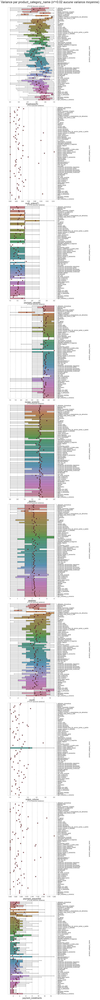

In [72]:
X = 'product_category_name'
ANOVA(df, X, yloc=0.885, hspace=0.07, width=7, heigth=0.2, display_kde=False)

## CHi2

p-value is:  1.907749174391085e-38
chi=219.854229, critical value=24.995790
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
    They are not independent.


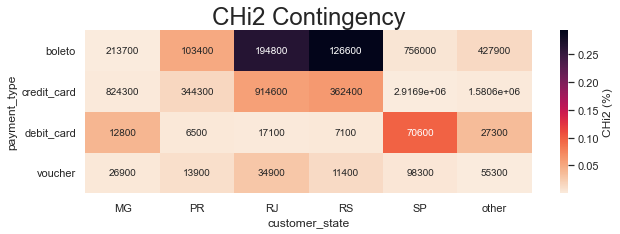

In [73]:
chi2(df, 'payment_type', 'customer_state', heigth=3, width=10)

p-value is:  1.4791266687403458e-184
chi=1770.187591, critical value=405.243502
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
    They are not independent.


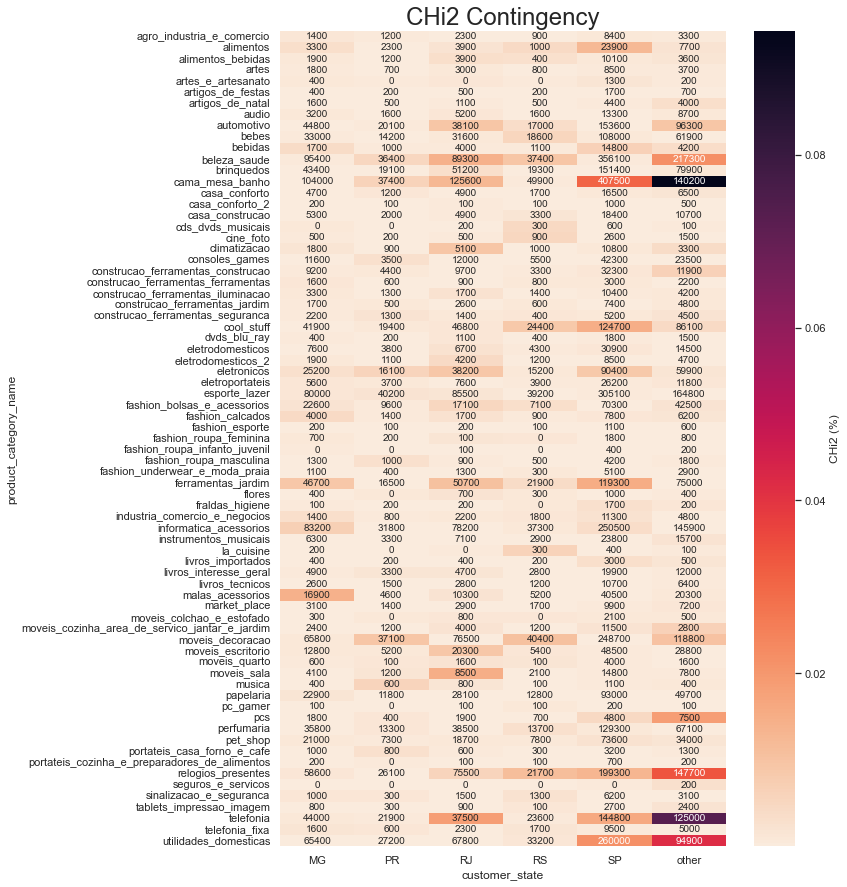

In [74]:
chi2(df, 'product_category_name', 'customer_state', heigth=15, width=10)

p-value is:  2.509761283641448e-72
chi=827.144961, critical value=251.286361
At 0.05 level of significance, we reject the null hypotheses and accept H1. 
    They are not independent.


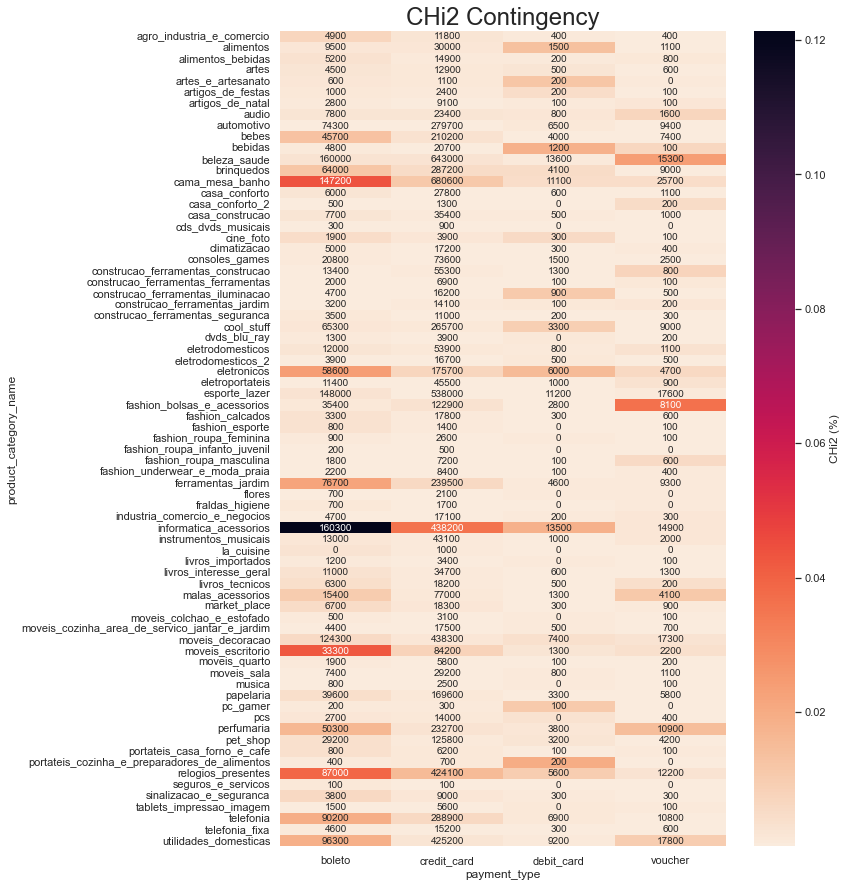

In [75]:
chi2(df, 'product_category_name', 'payment_type', heigth=15, width=10)

In [76]:
data = dfe

# Réducion Dimensionnelle

## PCA

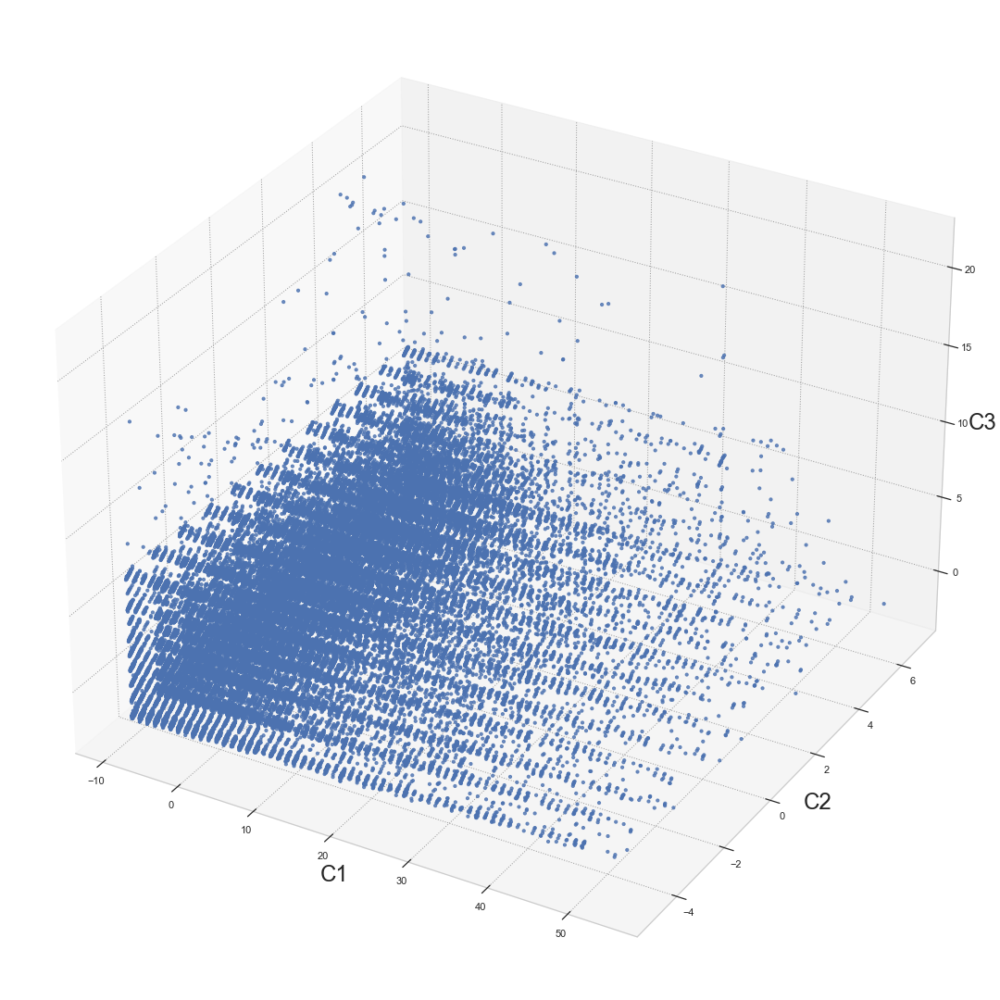

In [77]:
# enable responsive plot
%matplotlib widget

pca = PCA(data, 3, enable_display_circles=False, enable_display_scree_plot=False, display_3D=True)

## Variétés (Manifolds)

### UMAP

In [78]:
umaped = ManifoldReduction3D(data, manifold = umap.UMAP(n_neighbors=100, min_dist=0.0, metric='minkowski', n_components=3))

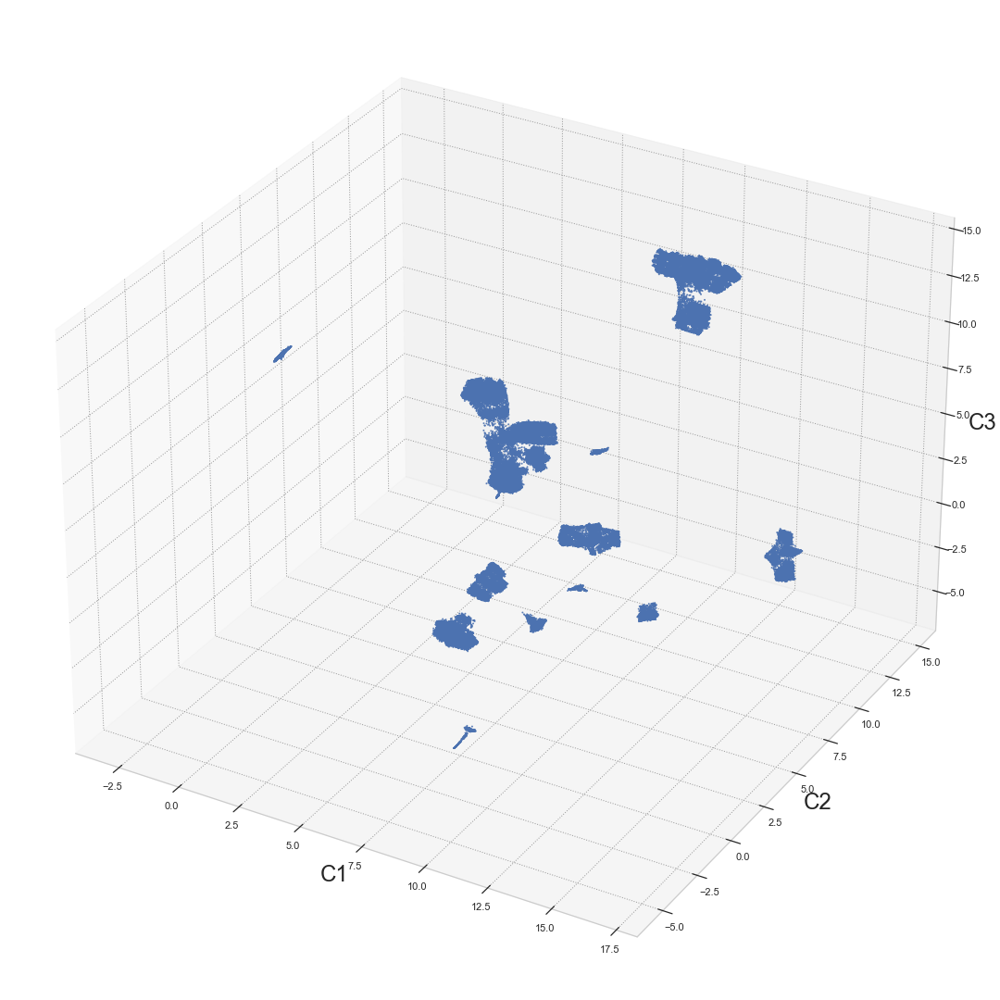

In [89]:
%matplotlib widget
DisplayManifold3D(umaped, s=1)

### t-SNE

In [80]:
# tsne_manifolded = ManifoldReduction3D(data, manifold = TSNE(n_components=3, perplexity=100, init="random", random_state=0, learning_rate='auto', metric='euclidean'))

In [81]:
# %matplotlib widget
# DisplayManifold3D(tsne_manifolded, s=1)

In [82]:
# tsne_manifolded = ManifoldReduction3D(data, manifold = TSNE(n_components=3, perplexity=100, init="random", random_state=0, learning_rate='auto', metric='minkowski'))

In [83]:
# %matplotlib widget
# DisplayManifold3D(tsne_manifolded, s=1)

In [84]:
%matplotlib widget
# DisplayManifold3D(tsne_manifolded, c=kmeans_pp[2].labels_)

In [85]:
 # disable responsive plot
%matplotlib inline

# Clustering

In [91]:
data = pd.DataFrame(umaped, columns=['C'+str(i) for i in range (1,4)]) #df5
scale = 'std'
hue = 'dfe'
display_components=0 # <1 aucun diplay, 3 display 3D, sinon display 2D sur le nombre de composantes choisies
%matplotlib widget

In [92]:
# Sélection des scores pour l'évaluation des modèles
scores = ['Calinski-Harabasz(Var)', 'Davies-Bouldin(Sim)', 'Silhouette']

Perfs = None
try :
    # Chargement des Perfs précédentes
    Perfs = pd.read_csv('Perfs.csv', low_memory=low_memory)
except:
    Perfs = pd.DataFrame(columns=['Model']+scores, index=[])

Perfs

,Model,Calinski-Harabasz(Var),Davies-Bouldin(Sim),Silhouette,Time(s),hue
0,HCW,11464.516386,1.518811,0.161723,48.516249,df5
1,HCA,13.993348,0.250809,0.590620,124.590627,df5
2,KMeans(2),87867.327667,0.738399,0.562978,1.254487,df5
3,KMeans(3),84476.615043,0.999435,0.348117,0.982829,df5
4,KMeans(4),69697.332669,1.134001,0.282659,0.856547,df5
...,...,...,...,...,...,...
620,BisectingKMeans(5),16408.611869,0.620137,0.534143,1.104470,isomap5
621,BisectingKMeans(6),15710.538212,0.790806,0.483240,1.427428,isomap5
622,BisectingKMeans(7),14757.941548,0.870189,0.404658,1.597991,isomap5
623,BisectingKMeans(8),13892.445066,0.916191,0.411966,1.930092,isomap5


## HC

### Ward

In [99]:
hcw = clustering(data.iloc[:min(20000,len(data)),:], AgglomerativeClustering(n_clusters=5, linkage='ward'), 'HCW', Perfs, scale=scale, scores=scores, hue=hue, display_components=display_components)

-------------------- HCW --------------------
Model                              HCW
Calinski-Harabasz(Var)    36315.995585
Davies-Bouldin(Sim)           0.594014
Silhouette                    0.675817
Time(s)                      58.271575
hue                                dfe
Name: 625, dtype: object


### Single Linkage

In [100]:
hcs = clustering(data, AgglomerativeClustering(n_clusters=5, linkage='single'), 'HCA', Perfs, scale=scale, scores=scores, hue=hue, display_components=display_components)

-------------------- HCA --------------------
Model                              HCA
Calinski-Harabasz(Var)    26920.228357
Davies-Bouldin(Sim)           0.665626
Silhouette                    0.419985
Time(s)                      73.761551
hue                                dfe
Name: 626, dtype: object


## K-Means

In [101]:
n_iter = 2
kmin = 4
kmax = 10

In [102]:
kmeans = []
for i in range(n_iter):
    for k in range(kmin, kmax+1):
        cls = clustering(data, KMeans(n_clusters=k, random_state=None, init='random'), 'KMeans('+str(k)+')', Perfs, scale=scale, scores=scores, hue=hue, display_components=display_components)
        kmeans.append(cls)

-------------------- KMeans(4) --------------------
Model                         KMeans(4)
Calinski-Harabasz(Var)    133063.000571
Davies-Bouldin(Sim)            0.792061
Silhouette                     0.632871
Time(s)                        1.304807
hue                                 dfe
Name: 627, dtype: object
-------------------- KMeans(5) --------------------
Model                         KMeans(5)
Calinski-Harabasz(Var)    166552.563837
Davies-Bouldin(Sim)             0.59531
Silhouette                     0.677242
Time(s)                        0.785497
hue                                 dfe
Name: 628, dtype: object
-------------------- KMeans(6) --------------------
Model                         KMeans(6)
Calinski-Harabasz(Var)    218075.688967
Davies-Bouldin(Sim)            0.444613
Silhouette                     0.713119
Time(s)                         0.88698
hue                                 dfe
Name: 629, dtype: object
-------------------- KMeans(7) ------------------

## K-Means++ 

In [103]:
kmeans_pp = []
for i in range(n_iter):
    for k in range(kmin, kmax+1):
        cls = clustering(data, KMeans(n_clusters=k, random_state=None, init='k-means++'), 'KMeans++('+str(k)+')', Perfs, scale=scale, scores=scores, hue=hue, display_components=display_components)
        kmeans_pp.append(cls)

-------------------- KMeans++(4) --------------------
Model                       KMeans++(4)
Calinski-Harabasz(Var)    133063.000571
Davies-Bouldin(Sim)            0.792061
Silhouette                     0.632871
Time(s)                        1.254802
hue                                 dfe
Name: 641, dtype: object
-------------------- KMeans++(5) --------------------
Model                       KMeans++(5)
Calinski-Harabasz(Var)    166552.563837
Davies-Bouldin(Sim)             0.59531
Silhouette                     0.677242
Time(s)                        1.251203
hue                                 dfe
Name: 642, dtype: object
-------------------- KMeans++(6) --------------------
Model                       KMeans++(6)
Calinski-Harabasz(Var)    218075.688967
Davies-Bouldin(Sim)            0.444613
Silhouette                     0.713119
Time(s)                        1.340078
hue                                 dfe
Name: 643, dtype: object
-------------------- KMeans++(7) ----------

In [ ]:
Perfs.to_csv('Perfs.csv', index=False)

In [ ]:
cls = kmeans_pp[0]    
clusteringCenters(data, cls, scale=scale)

,Freshness(R),multi_orders(F),payment_value(M),review_score(S),daytime,weekday,month,orders_volume,payment_sequential,payment_installments,pcateg,customer_state,payment_type
0,0.803767,0.034596,2.358687,9.456993,3.922274,9.558781,26.873055,2.175812,1.428930,10.774164,597.314272,9.191615,4.311453
1,0.808413,0.034465,2.386808,9.527787,3.924413,9.584027,27.860267,2.157542,1.430089,10.957723,378.051297,9.263190,4.306075


## MiniBatchKMeans

In [ ]:
minibatch_kmeans = []
for i in range(n_iter):
    for k in range(kmin, kmax+1):
        cls = clustering(data, MiniBatchKMeans(n_clusters=k, random_state=None, init='k-means++', tol=0.001, batch_size = 2048), 'MiniBatchKMeans('+str(k)+')', Perfs, scale=scale, scores=scores, hue=hue, display_components=display_components)
        minibatch_kmeans.append(cls)

## BisectingKMeans

In [ ]:
bisecting_kmeans = []
for i in range(n_iter):
    for k in range(kmin, kmax+1):
        cls = clustering(data, BisectingKMeans(n_clusters=k, random_state=None, init='k-means++', n_init=3), 'BisectingKMeans('+str(k)+')', Perfs, scale=scale, scores=scores, hue=hue, display_components=display_components)
        bisecting_kmeans.append(cls)

-------------------- BisectingKMeans(2) --------------------
Model                     BisectingKMeans(2)
Calinski-Harabasz(Var)          87867.327667
Davies-Bouldin(Sim)                 0.738399
Silhouette                          0.562978
Time(s)                             0.408661
hue                                      df5
Name: 212, dtype: object
-------------------- BisectingKMeans(3) --------------------
Model                     BisectingKMeans(3)
Calinski-Harabasz(Var)          76959.451129
Davies-Bouldin(Sim)                  1.12816
Silhouette                          0.305766
Time(s)                             0.713303
hue                                      df5
Name: 213, dtype: object
-------------------- BisectingKMeans(4) --------------------
Model                     BisectingKMeans(4)
Calinski-Harabasz(Var)          57515.525675
Davies-Bouldin(Sim)                 1.392475
Silhouette                          0.216225
Time(s)                             0.780685
hu

## DBSCAN

In [ ]:
%matplotlib widget
dbscan = clustering(data, DBSCAN(eps=2, min_samples=50, n_jobs=-1), 'DBSCAN', Perfs, scale=scale, scores=scores, hue=hue, display_components=display_components)

-------------------- DBSCAN --------------------
Model                          DBSCAN
Calinski-Harabasz(Var)    2160.105667
Davies-Bouldin(Sim)          1.562368
Silhouette                  -0.236398
Time(s)                     30.920804
hue                               df5
Name: 282, dtype: object


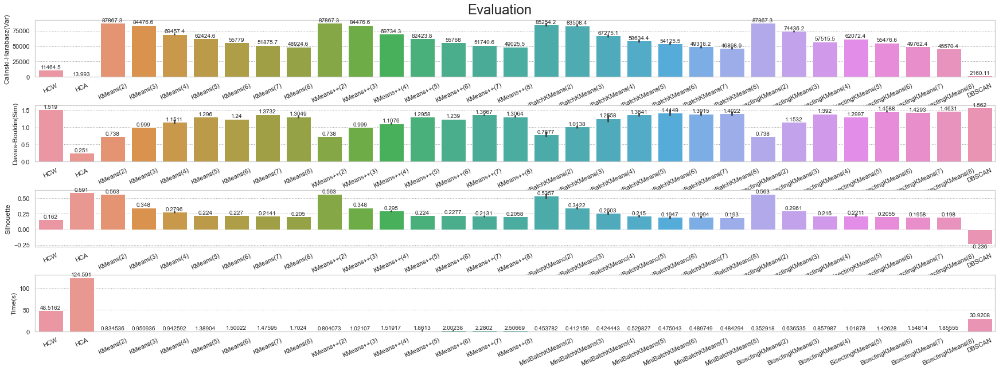

In [ ]:
%matplotlib inline
# display_scores(Perfs.sort_values(by='Model'),  width=30, height =10, rotation=25, hspace=0.5)
display_scores(Perfs, hue='Data', width=30, height =10, rotation=25, hspace=0.5)

In [ ]:
Perfs.to_csv('Perfs.csv', index=False)

## KModes

In [ ]:
# préparation des données pour le clustering
X = data.iloc[:, 1:].values
categs = ['multi_orders(F)', 'payment_value(M)', 'daytime', 'weekday', 'month', 'review_score(S)', 'pcateg', 'payment_type', 'customer_state']
X = data[categs].values

# Choosing optimal K
cost = []
kmodes = []
kmin = 4
kmax = 10
for k in range(kmin, kmax+1):
    kmode = KModes(n_jobs = 4, n_clusters = k, init = 'Huang', random_state = 0)
    kmodes.append(kmode)
    kmode.fit_predict(X)
    cost.append(kmode.cost_)
    print('Cluster initiation: {}'.format(k))


Cluster initiation: 2
Cluster initiation: 3
Cluster initiation: 4
Cluster initiation: 5
Cluster initiation: 6
Cluster initiation: 7
Cluster initiation: 8
Cluster initiation: 9
Cluster initiation: 10


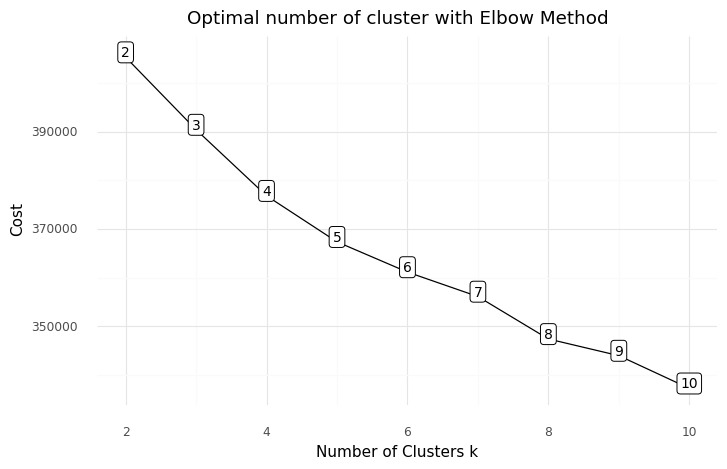

<ggplot: (110752970433)>

In [ ]:
%matplotlib inline
# Use the theme of ggplot
plt.style.use('ggplot')

df_cost = pd.DataFrame({'Cluster': range(kmin, kmax+1), 'Cost': cost})# Data viz
plotnine.options.figure_size = (8, 4.8)
(
    ggplot(data = df_cost)+
    geom_line(aes(x = 'Cluster',
                  y = 'Cost'))+
    geom_point(aes(x = 'Cluster',
                   y = 'Cost'))+
    geom_label(aes(x = 'Cluster',
                   y = 'Cost',
                   label = 'Cluster'),
               size = 10,
               nudge_y = 1000) +
    labs(title = 'Optimal number of cluster with Elbow Method')+
    xlab('Number of Clusters k')+
    ylab('Cost')+
    theme_minimal()
)

In [ ]:
plt.style.use('seaborn-whitegrid')

In [ ]:
best_kmodes = kmodes[5]

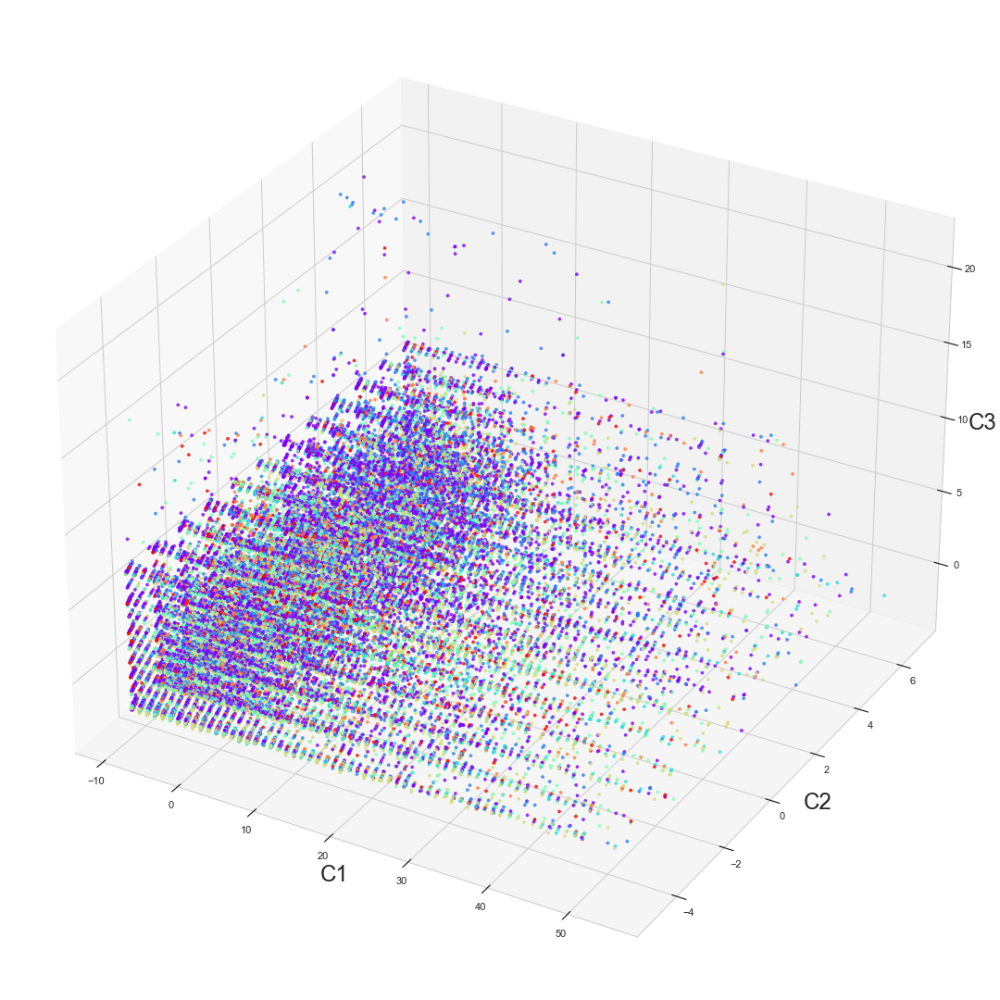

In [ ]:
%matplotlib widget
X = data
pcs = PCA(X, 3, discrete_illustrative_var=best_kmodes.labels_, enable_display_circles=False, enable_display_scree_plot=False, scale=scale, display_3D=True)

## KPrototype

In [ ]:
data

,customer_unique_id_x,Freshness(R),multi_orders(F),payment_value(M),review_score(S),daytime,weekday,month,orders_volume,payment_sequential,payment_installments,pcateg,customer_state,payment_type
0,0000366f3b9a7992bf8c76cfdf3221e2,0.840025,0,2.0,5.0,1.0,3.0,10.0,1,1,8,63.0,5.0,3.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,0.835723,0,1.0,4.0,1.0,6.0,10.0,1,1,1,62.0,5.0,3.0
2,0000f46a3911fa3c0805444483337064,0.227613,0,1.0,3.0,2.0,2.0,8.0,1,1,8,55.0,4.0,3.0
3,0000f6ccb0745a6a4b88665a16c9f078,0.538405,0,1.0,4.0,2.0,3.0,1.0,1,1,4,56.0,4.0,3.0
4,0004aac84e0df4da2b147fca70cf8255,0.585848,0,2.0,5.0,2.0,5.0,3.0,1,1,6,56.0,5.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91471,fffcf5a5ff07b0908bd4e2dbc735a684,0.357120,0,4.0,5.0,2.0,3.0,7.0,3,1,10,62.0,4.0,3.0
91472,fffea47cd6d3cc0a88bd621562a9d061,0.623285,0,1.0,4.0,2.0,1.0,2.0,1,1,1,49.0,4.0,3.0
91473,ffff371b4d645b6ecea244b27531430a,0.182688,0,2.0,5.0,3.0,5.0,5.0,1,1,1,54.0,4.0,3.0
91474,ffff5962728ec6157033ef9805bacc48,0.828774,0,2.0,5.0,3.0,4.0,10.0,1,1,5,57.0,4.0,3.0


In [ ]:
# préparation des données pour le clustering
X = data.iloc[:, 1:]
categs = ['multi_orders(F)', 'payment_value(M)', 'daytime', 'weekday', 'month', 'review_score(S)', 'pcateg', 'payment_type', 'customer_state']
catColumnsPos = [X.columns.get_loc(col) for col in categs]

X[colsOfType(X)] = Std_Scaled(X[colsOfType(X)], frame=True)
X[categs] = data[categs]
cols = X.columns.tolist()
X = X.values

array([ 0.82195384,  0.        ,  2.        ,  5.        ,  1.        ,
        3.        , 10.        , -0.22667564, -0.12118126,  1.88105305,
       63.        ,  5.        ,  3.        ])

In [ ]:
# Choosing optimal K
cost = []
kprototypes = []
kmin = 4
kmax = 10
for k in range(kmin, kmax+1):
    kprototype = KPrototypes(n_jobs = 3, n_clusters = k, init = 'Huang', random_state = 0)
    kprototypes.append(kprototype)
    kprototype.fit_predict(X, categorical = catColumnsPos)
    cost.append(kprototype.cost_)
    print('Cluster initiation: {}'.format(k))

Cluster initiation: 2
Cluster initiation: 3
Cluster initiation: 4
Cluster initiation: 5
Cluster initiation: 6
Cluster initiation: 7
Cluster initiation: 8
Cluster initiation: 9
Cluster initiation: 10


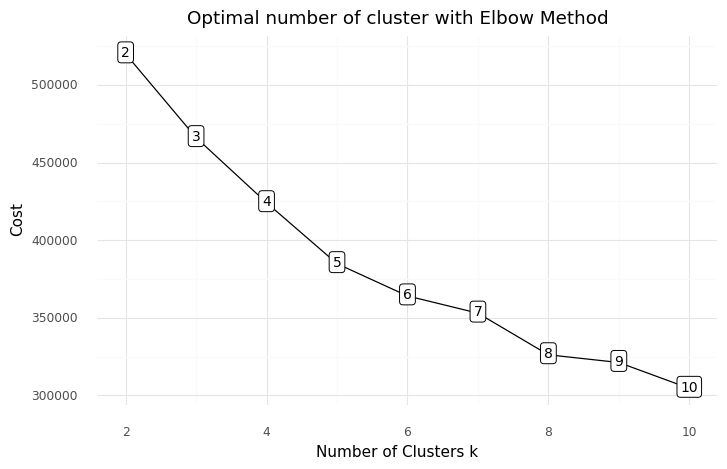

<ggplot: (110752876051)>

In [ ]:
%matplotlib inline
# Use the theme of ggplot
plt.style.use('ggplot')

df_cost = pd.DataFrame({'Cluster': range(kmin, kmax+1), 'Cost': cost})# Data viz
plotnine.options.figure_size = (8, 4.8)
(
    ggplot(data = df_cost)+
    geom_line(aes(x = 'Cluster',
                  y = 'Cost'))+
    geom_point(aes(x = 'Cluster',
                   y = 'Cost'))+
    geom_label(aes(x = 'Cluster',
                   y = 'Cost',
                   label = 'Cluster'),
               size = 10,
               nudge_y = 1000) +
    labs(title = 'Optimal number of cluster with Elbow Method')+
    xlab('Number of Clusters k')+
    ylab('Cost')+
    theme_minimal()
)

In [ ]:
plt.style.use('seaborn-whitegrid')
sns.set()  # Définir le style par défaut pour les graphiques
sns.set_style("whitegrid", {"grid.color": ".6", "grid.linestyle": ":"})

In [ ]:
best_kprototypes = kprototypes[-1]

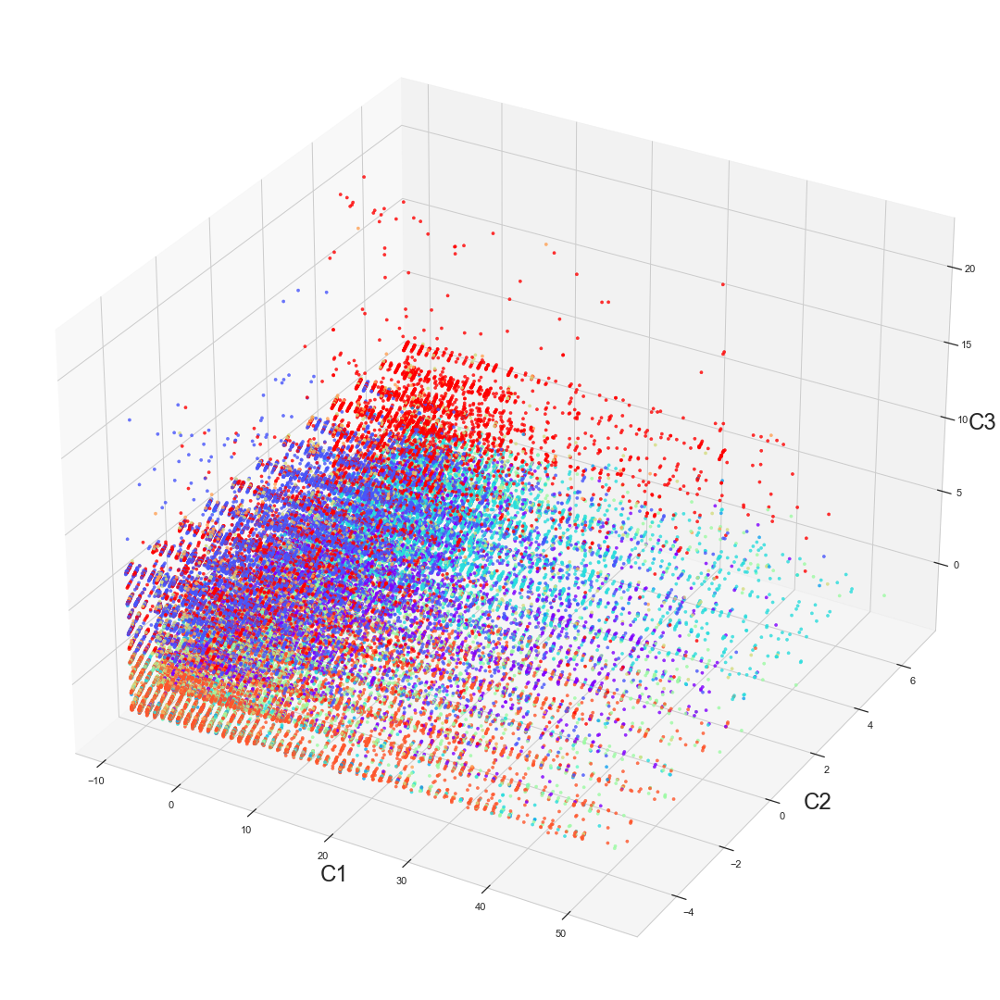

In [ ]:
%matplotlib widget
X = data
pcs = PCA(X, 3, discrete_illustrative_var=best_kprototypes.labels_, enable_display_circles=False, enable_display_scree_plot=False, scale=scale, display_3D=True)

## Comparaison

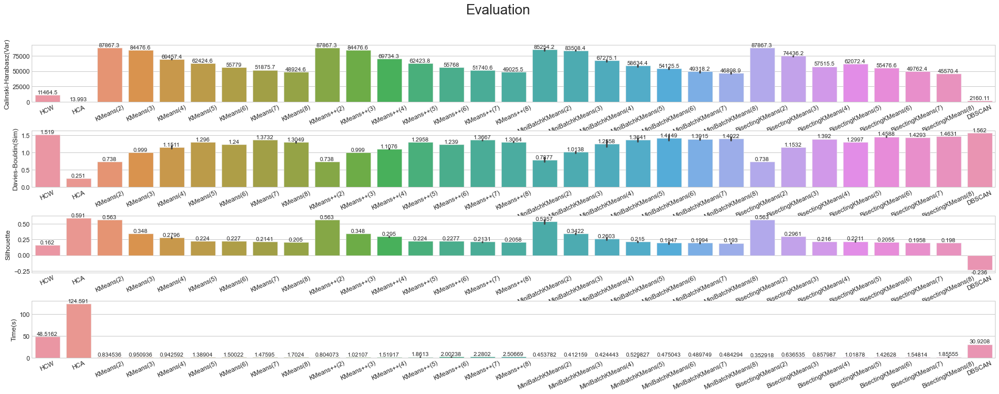

In [ ]:
%matplotlib inline
display_scores(Perfs, None, width=30, height =10, rotation=25, hspace=0.5)

In [ ]:
best_model = kmeans_pp[2]
best_k=4

# Stabilité & Evaluation

## Evaluation

In [ ]:
data = data.copy()
data['Cluster'] = best_model.labels_

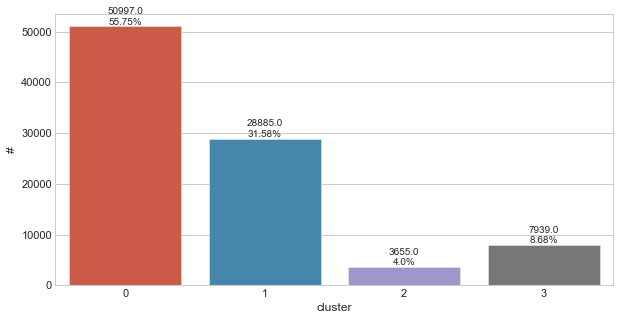

In [ ]:
clusters = data.groupby('Cluster').count().iloc[:,0]
barplot(x=clusters.index.tolist(), y=clusters, ylabel='#', xlabel='cluster')

In [ ]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import  HistGradientBoostingClassifier, GradientBoostingClassifier
from sklearn.metrics import roc_curve, auc, plot_roc_curve
from sklearn.preprocessing import label_binarize
from itertools import cycle

# Sélection des attributs
XCols = colsOfType(data)
y = 'Cluster'
# Binarize the output
X = data.sort_values(by=[y])[XCols[:-1]]
y = label_binarize(data[y], classes=data[y].unique().tolist())
n_classes = y.shape[1]
# shuffle and split training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
X_train=Std_Scaled(X_train)
X_test=Std_Scaled(X_test)

# Sélection des scores pour l'évaluation des modèles
score_cv = 'roc_auc_ovr_weighted'

param_grid = {'random_state':np.arange(5), 'l2_regularization': np.logspace(-2, 2, 5), 'learning_rate': np.logspace(-4, -1, 4), 'max_depth':np.arange(1,5)}
cv_hgbc = RandomizedSearchCV(
        HistGradientBoostingClassifier(),  
        param_grid,     # hyperparamètres à tester
        cv=5,           # nombre de folds de validation croisée
        scoring=score_cv,   # score à optimiser
        n_jobs=-1
    )

# Learn to predict each class against the other
classifier = OneVsRestClassifier(cv_hgbc, n_jobs=-1)
y_score = classifier.fit(X_train, y_train).decision_function(X_test)

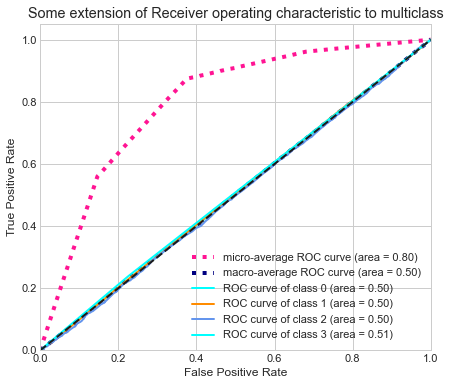

In [ ]:
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
lw=2
plt.figure(figsize=(7, 6))

plt.plot(fpr["micro"], tpr["micro"], label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]), color="deeppink", linestyle=":", linewidth=4)
plt.plot(fpr["macro"], tpr["macro"], label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]), color="navy", linestyle=":", linewidth=4)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw, label="ROC curve of class {0} (area = {1:0.2f})".format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], "k--", lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Some extension of Receiver operating characteristic to multiclass")
plt.legend(loc="lower right")
plt.show()

-------------- Class 0  --------------


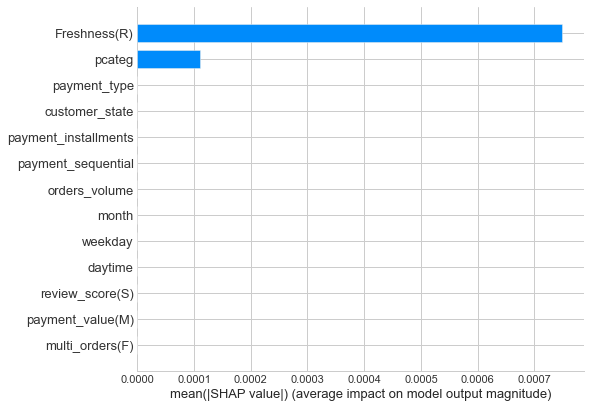

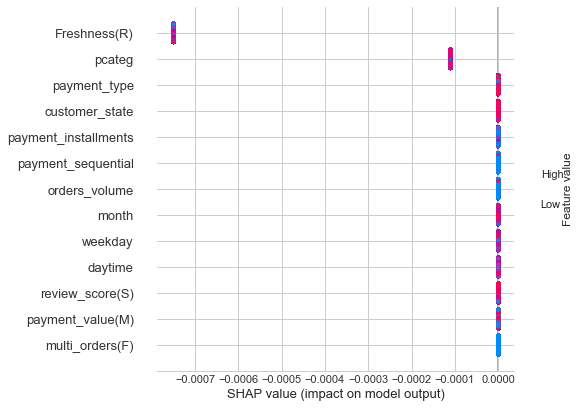

-------------- Class 1  --------------


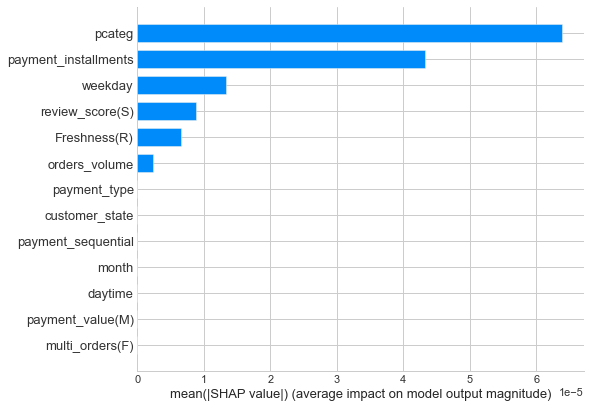

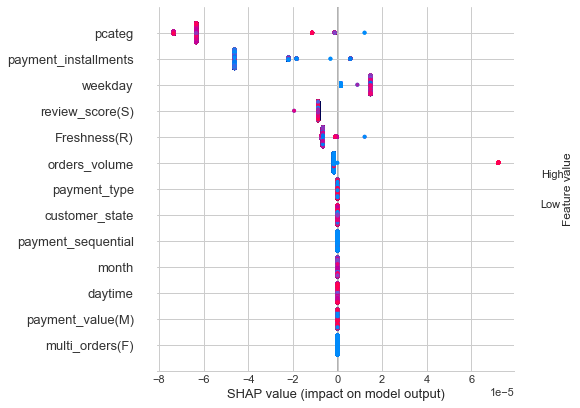

-------------- Class 2  --------------


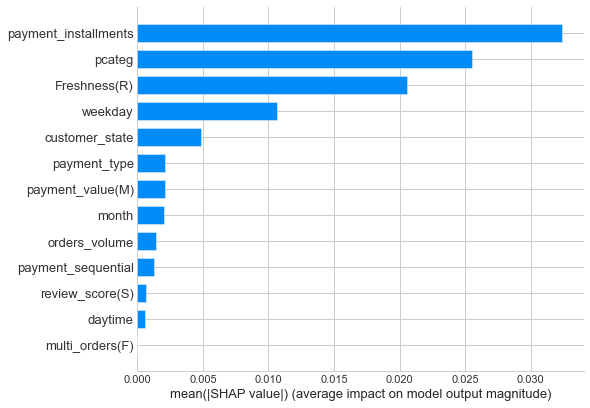

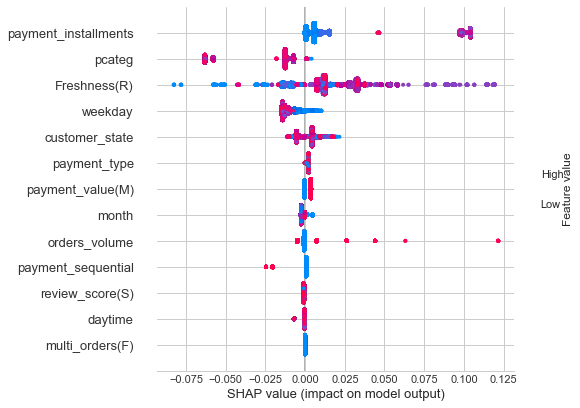

-------------- Class 3  --------------


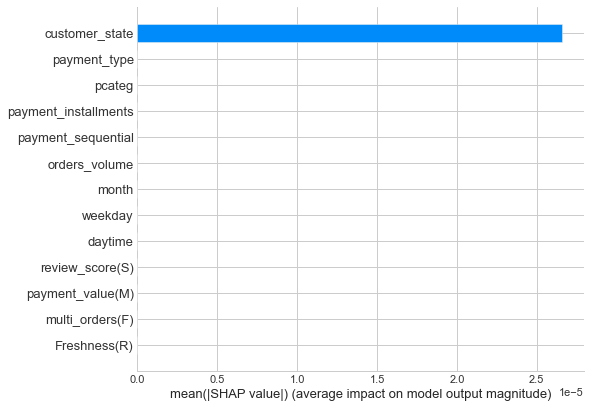

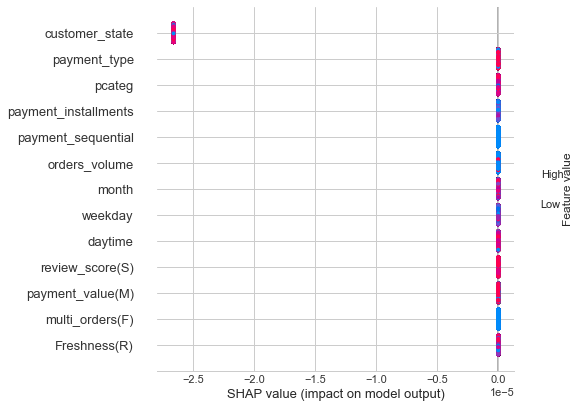

In [ ]:
for i in range(4):
    print('-------------- Class', str(i), ' --------------')
    explainer = shap.TreeExplainer(classifier.estimators_[i].best_estimator_)
    shap_values = explainer.shap_values(X)
    shap.summary_plot(shap_values, X, plot_type="bar")
    shap.summary_plot(shap_values, X)

## Stabilité Algorithmique

In [ ]:
from sklearn.cluster import KMeans

scores = ['Calinski-Harabasz(Var)', 'Davies-Bouldin(Sim)', 'Silhouette']
Perfs_seeds = pd.DataFrame(columns=['Model']+scores, index=[])
meta_kmeans_seeds = []
n_seeds = 20
n_iter = 10

for j in range(n_iter):
    kmeans_seeds = []
    for i in range(n_seeds):        
        cls = clustering(df, KMeans(n_clusters=best_k, random_state=i, init='k-means++'), 'KMeans++('+str(i)+')', Perfs_seeds, scale=scale, scores=scores, hue=hue, display_components=display_components)
        kmeans_seeds.append(cls)
    meta_kmeans_seeds.append(kmeans_seeds)

-------------------- KMeans++(0) --------------------
Model                      KMeans++(0)
Calinski-Harabasz(Var)    34513.129262
Davies-Bouldin(Sim)           1.366965
Silhouette                    0.240835
Time(s)                       1.352993
hue                                df5
Name: 0, dtype: object
-------------------- KMeans++(1) --------------------
Model                      KMeans++(1)
Calinski-Harabasz(Var)    34513.063299
Davies-Bouldin(Sim)            1.36693
Silhouette                    0.240835
Time(s)                       3.437186
hue                                df5
Name: 1, dtype: object
-------------------- KMeans++(2) --------------------
Model                      KMeans++(2)
Calinski-Harabasz(Var)    34513.063299
Davies-Bouldin(Sim)            1.36693
Silhouette                    0.240835
Time(s)                       1.622135
hue                                df5
Name: 2, dtype: object
-------------------- KMeans++(3) --------------------
Model        

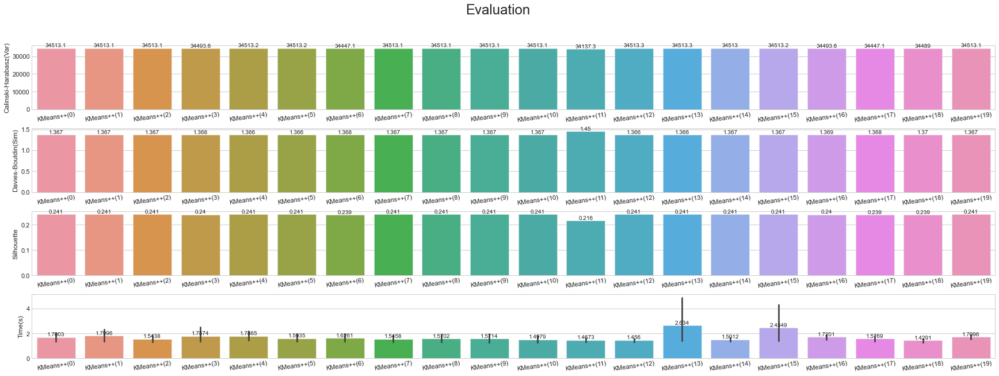

In [ ]:
display_scores(Perfs_seeds, None, width=30, height=10)

In [ ]:
from sklearn import metrics

n_rept = len(meta_kmeans_seeds)
kmeans_ARIs = np.zeros((n_seeds, n_seeds))

for h in range(n_rept):
    kmeans_seeds = meta_kmeans_seeds[h]
    for i in range(n_seeds):
        for j in range(n_seeds):
            kmeans_ARIs[i,j] += metrics.adjusted_rand_score(kmeans_seeds[i].labels_, kmeans_seeds[j].labels_)
kmeans_ARIs /= n_rept

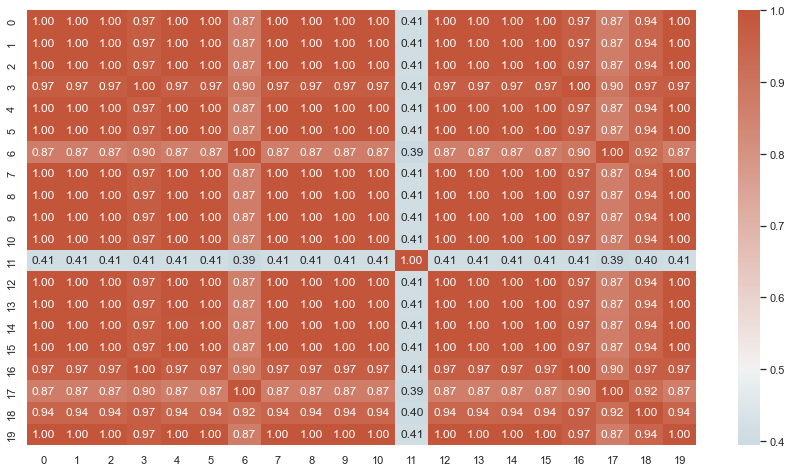

In [ ]:
fig, ax = plt.subplots(figsize=(15, 8))
ax = sns.heatmap(kmeans_ARIs, vmax=1, center=0.5, annot=True, fmt=".2f", cmap = sns.diverging_palette(230, 20, as_cmap=True))
plt.show()

## Stabilité Temporelle

In [ ]:
data = data.rename(columns={'customer_unique_id_x':'customer_unique_id'})

In [ ]:
dft = pd.merge(data, orders_freshness[['customer_unique_id', 'timestamp']], how='inner', on=['customer_unique_id']).sort_values(by='timestamp')
dft

,customer_unique_id,Freshness(R),multi_orders(F),payment_value(M),review_score(S),daytime,weekday,month,orders_volume,payment_sequential,payment_installments,pcateg,customer_state,payment_type,Cluster,timestamp
17011,2f64e403852e6893ae37485d5fcacdaf,0.000000,0,1.0,4.0,3.0,6.0,1.0,1,1,1,61.0,1.0,2.0,0,2016-10-03 16:56:50
35094,61db744d2f835035a5625b59350c6b63,0.000257,0,1.0,3.0,2.0,6.0,1.0,1,1,1,61.0,1.0,2.0,0,2016-10-03 21:13:36
50378,8d3a54507421dbd2ce0a1d58046826e0,0.000309,0,2.0,1.0,2.0,6.0,1.0,1,1,6,59.0,5.0,3.0,0,2016-10-03 22:06:03
48431,87776adb449c551e74c13fc34f036105,0.000334,0,1.0,5.0,2.0,6.0,1.0,1,1,4,27.0,5.0,3.0,2,2016-10-03 22:31:31
41385,7390ed59fa1febbfda31a80b4318c8cb,0.000347,0,2.0,5.0,2.0,6.0,1.0,1,1,2,53.0,4.0,3.0,1,2016-10-03 22:44:10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43694,7a22d14aa3c3599238509ddca4b93b01,0.999845,0,1.0,1.0,3.0,4.0,11.0,1,1,7,53.0,5.0,3.0,1,2018-08-29 12:25:59
33143,5c58de6fb80e93396e2f35642666b693,0.999958,0,2.0,5.0,3.0,4.0,11.0,2,1,8,30.0,0.0,3.0,2,2018-08-29 14:18:23
45801,7febafa06d9d8f232a900a2937f04338,0.999958,0,1.0,5.0,3.0,4.0,11.0,1,1,1,62.0,2.0,1.0,0,2018-08-29 14:18:28
65484,b701bebbdf478f5500348f03aff62121,0.999991,0,1.0,3.0,3.0,4.0,11.0,1,1,1,6.0,5.0,3.0,2,2018-08-29 14:52:00


### Par Jours

In [ ]:
Perfs_days = pd.DataFrame(columns=['Model']+scores, index=[])
from sklearn.cluster import KMeans
kmeans_days = []
nb_days = 60
for i in range(nb_days):
    cls = clustering(dft[dft['timestamp'].max()-dft['timestamp']>pd.Timedelta(i, 'd')], KMeans(n_clusters=best_k, init='k-means++'), 'KMeans++('+str(i)+')', Perfs_days, scale=scale, scores=scores, hue=hue, display_components=display_components)
    kmeans_days.append(cls)

-------------------- KMeans++(0) --------------------
Model                      KMeans++(0)
Calinski-Harabasz(Var)    70438.948403
Davies-Bouldin(Sim)           1.092372
Silhouette                    0.303071
Time(s)                       1.403492
hue                                df5
Name: 0, dtype: object
-------------------- KMeans++(1) --------------------
Model                      KMeans++(1)
Calinski-Harabasz(Var)    70402.248707
Davies-Bouldin(Sim)           1.092298
Silhouette                    0.303084
Time(s)                       2.044604
hue                                df5
Name: 1, dtype: object
-------------------- KMeans++(2) --------------------
Model                      KMeans++(2)
Calinski-Harabasz(Var)    70376.353007
Davies-Bouldin(Sim)           1.092168
Silhouette                    0.303129
Time(s)                       3.235312
hue                                df5
Name: 2, dtype: object
-------------------- KMeans++(3) --------------------
Model        

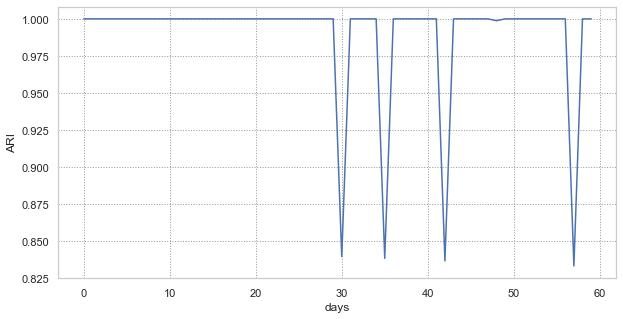

In [ ]:
ARI_days = [metrics.adjusted_rand_score(kmeans_days[0].labels_[:len(kmeans_days[i].labels_)], kmeans_days[i].labels_) for i in range(nb_days)]
lineplot(y=ARI_days, x=np.arange(len(ARI_days)), ylabel='ARI', xlabel='days')

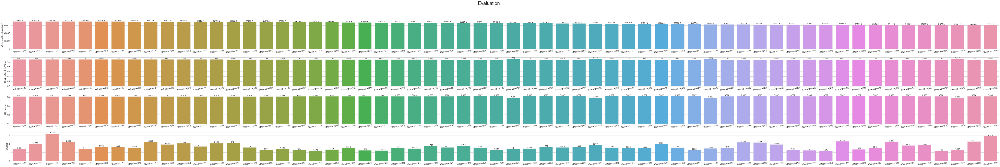

In [ ]:
display_scores(Perfs_days, None)

### Par Semaines

In [ ]:
Perfs_weeks = pd.DataFrame(columns=['Model']+scores, index=[])
from sklearn.cluster import KMeans
kmeans_weeks = []
nb_weeks = 20
for i in range(nb_weeks):
    cls = clustering(dft[dft['timestamp'].max()-dft['timestamp']>pd.Timedelta(7*i, 'd')], KMeans(n_clusters=5, init='k-means++'), 'KMeans++('+str(i)+')', Perfs_weeks, scale=scale, scores=scores, hue=hue, display_components=display_components)
    kmeans_weeks.append(cls)

-------------------- KMeans++(0) --------------------
Model                      KMeans++(0)
Calinski-Harabasz(Var)    62954.258567
Davies-Bouldin(Sim)           1.289272
Silhouette                    0.227079
Time(s)                         2.2384
hue                                df5
Name: 0, dtype: object
-------------------- KMeans++(1) --------------------
Model                      KMeans++(1)
Calinski-Harabasz(Var)    62459.987995
Davies-Bouldin(Sim)           1.294461
Silhouette                    0.226433
Time(s)                       2.045241
hue                                df5
Name: 1, dtype: object
-------------------- KMeans++(2) --------------------
Model                      KMeans++(2)
Calinski-Harabasz(Var)    61136.924379
Davies-Bouldin(Sim)           1.284986
Silhouette                    0.228663
Time(s)                       2.062433
hue                                df5
Name: 2, dtype: object
-------------------- KMeans++(3) --------------------
Model        

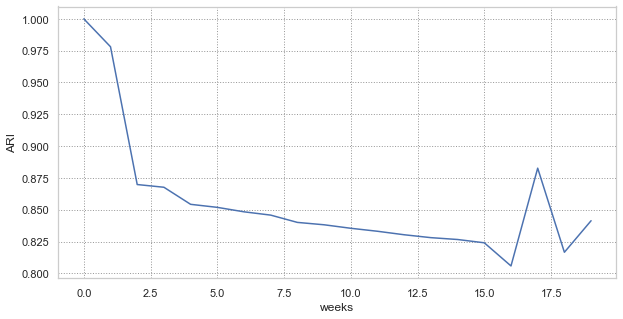

In [ ]:
ARI_weeks = [metrics.adjusted_rand_score(kmeans_weeks[0].labels_[:len(kmeans_weeks[i].labels_)], kmeans_weeks[i].labels_) for i in range(nb_weeks)]
lineplot(y=ARI_weeks, x=np.arange(len(ARI_weeks)), ylabel='ARI', xlabel='weeks')

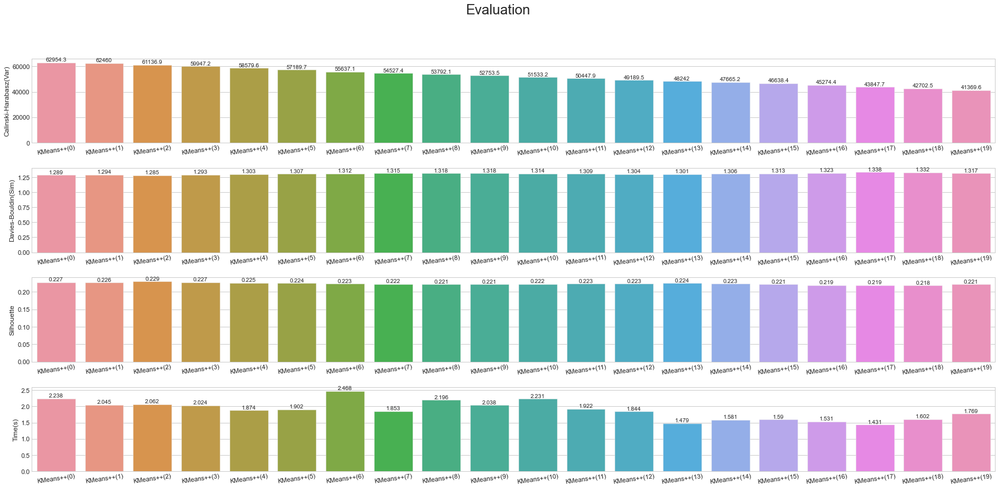

In [ ]:
display_scores(Perfs_weeks, None)

### Par Mois

In [ ]:
Perfs_months = pd.DataFrame(columns=['Model']+scores, index=[])
from sklearn.cluster import KMeans
kmeans_months = []
nb_months = 20
for i in range(nb_months):
    cls = clustering(dft[dft['timestamp'].max()-dft['timestamp']>pd.Timedelta(30*i, 'd')], KMeans(n_clusters=5, init='k-means++'), 'KMeans++('+str(i)+')', Perfs_months, scale=scale, scores=scores, hue=hue, display_components=display_components)
    kmeans_months.append(cls)

-------------------- KMeans++(0) --------------------
Model                     KMeans++(0)
Calinski-Harabasz(Var)    62962.89902
Davies-Bouldin(Sim)          1.291774
Silhouette                   0.227045
Time(s)                      1.371029
hue                               df5
Name: 0, dtype: object
-------------------- KMeans++(1) --------------------
Model                      KMeans++(1)
Calinski-Harabasz(Var)    58166.665733
Davies-Bouldin(Sim)           1.305051
Silhouette                    0.225001
Time(s)                       2.058486
hue                                df5
Name: 1, dtype: object
-------------------- KMeans++(2) --------------------
Model                      KMeans++(2)
Calinski-Harabasz(Var)    53217.934405
Davies-Bouldin(Sim)           1.319626
Silhouette                    0.220951
Time(s)                       1.867778
hue                                df5
Name: 2, dtype: object
-------------------- KMeans++(3) --------------------
Model              

c:\Users\el-ha\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=5.


Model                     KMeans++(19)
Calinski-Harabasz(Var)       1085.3686
Davies-Bouldin(Sim)           1.112445
Silhouette                    0.302955
Time(s)                       0.710924
hue                                df5
Name: 19, dtype: object


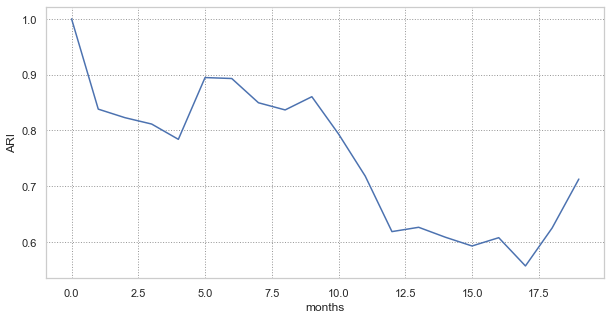

In [ ]:
ARI_months = [metrics.adjusted_rand_score(kmeans_months[0].labels_[:len(kmeans_months[i].labels_)], kmeans_months[i].labels_) for i in range(nb_months)]
lineplot(y=ARI_months, x=np.arange(len(ARI_months)), ylabel='ARI', xlabel='months')

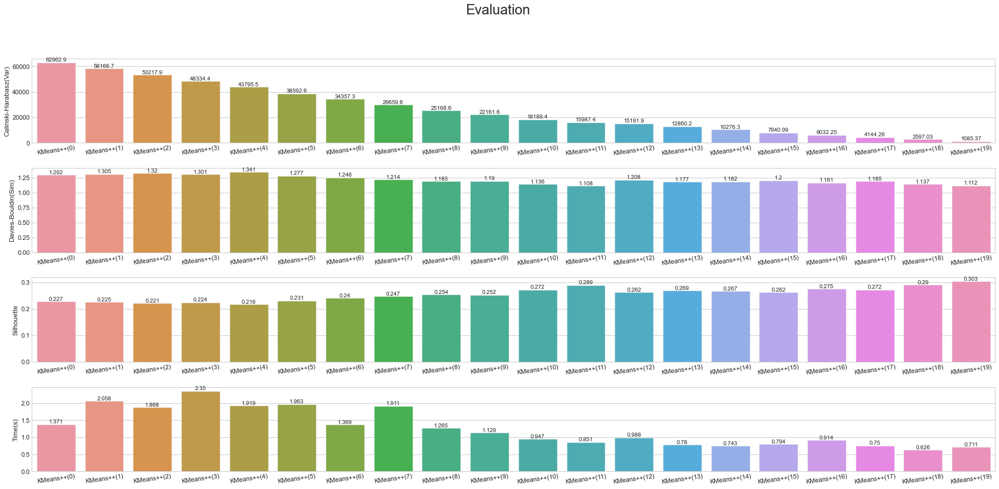

In [ ]:
display_scores(Perfs_months, None)